# 1) Background

This is our main notebook to train the model and test within our neuromodulated system with goal-driven perception with uncertain goal identity and uncertain goal validity. 

We have modified the PyTorch implementation of EB and c-EB by Sam Greydanus (https://github.com/greydanus/excitationbp/). The code script utils.py in the current directory was modified from his package based on our own network architecture. The two code scripts including *\__*init*\__*.py in the current directory and eb_linear.py in the subdirectory called functions were directly from his package. All the rest code scripts (including load_mnist_data_pair.py, define_model.py, predict_w_cEB.py, train_n_test_model.py, show_cEB_results.py, and regulate_MNIST_pair_uncertainty.py) and two ipython notebook files (including train_n_test_results.ipynb and neuromodulated_goal_driven_perception_results.ipynb) in this entire folder were written completely by us for this project. 

For an in-depth explanation of EB and c-EB, refer to [this paper](https://arxiv.org/abs/1608.00507). Their [original code](https://github.com/jimmie33/Caffe-ExcitationBP) of EB and c-EB is in Caffe.

This ipython notebook was completely written by us, who are anonymous authors of the submitted paper under review.

In [1]:
import torch
import numpy as np
import os, sys, copy ; sys.path.append('..')
from train_n_test_model import train_model
from predict_w_cEB import get_each_ceb_accuracy
from show_cEB_results import print_all_overall_stats, show_cEB_example
from regulate_MNIST_pair_uncertainty import MNIST_uncertainty_task, plot_MNIST_uncertainty, average_probs

reseed = lambda: np.random.seed(seed=1) ; ms = torch.manual_seed(1) # for reproducibility
reseed()

if torch.cuda.is_available():
    useCuda = True
else:
    useCuda = False

print(useCuda)

True


# 2) Train the model

In [2]:
model, dataloader = train_model(total_steps = 4400,test_every = 200,test_pair_num = 2000,toTest = False)


Start to train 4400 steps, each with 256 all-combination pairs.


# 4) Neuromodulated goal-driven perception with uncertainties
Part 4 directly follows Part 2. Part 3, which is independent of Part 4, is in the other ipython notebook file named train_n_test_results.ipynb in the same directory.

In [3]:
ACH_CORRECT=1.20
ACH_INCORRECT=0.85
NE_INCORRECT=1.10
NE_CORRECT=0.85
trialRange=30
trialInterval=400
num_considered=10
num_threshold=8
hasAChLesion=False
hasNELesion=False

## 4.1: Single Valid Cue
Randomly change trial interval within the range (200+/-20) and have a single valid cue for each cue switch, and use one of the validity options: 0.99, 0.85, 0.70

In [4]:
alterValid=False

### 4.1.1: validity_choices=0.99

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
42/3999 = 1.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
558/3999 = 14.0% trials occurred when the predicted digit did not match the cued digit.
    369/3999 trials occurred when the predicted digit did not match the guess-target digit.
    215/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3399/3999 = 85.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [13 38 40 32 33 35 28 51 32 35], and mean of lag length (excluding consistently same cue) is 36.0


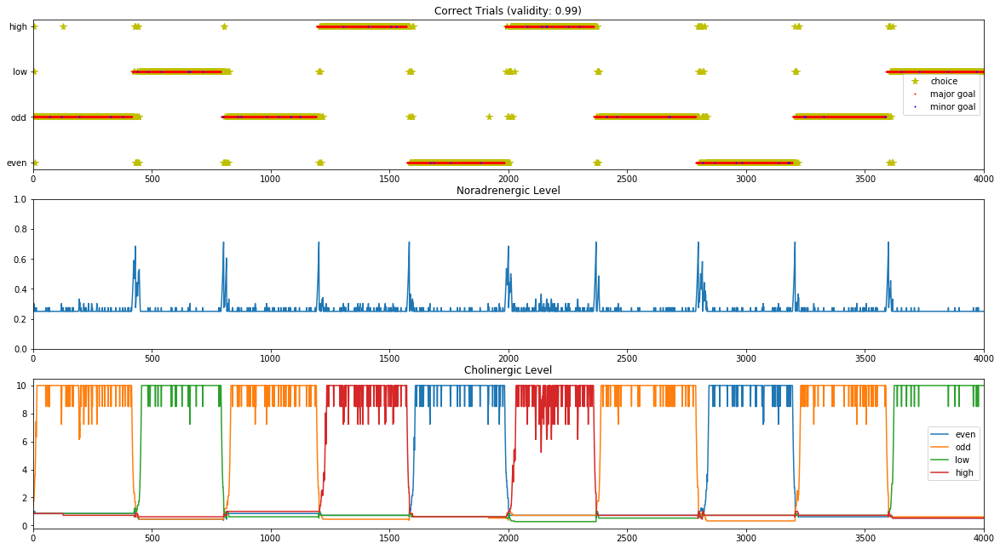

In [5]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_cues=np.array([1,2,1,3,0,3,1,0,1,2]),hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
51/3999 = 1.3% trials occurred when the predicted digit matched the cued digit but the cue was invalid
538/3999 = 13.5% trials occurred when the predicted digit did not match the cued digit.
    366/3999 trials occurred when the predicted digit did not match the guess-target digit.
    188/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3410/3999 = 85.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [16 29 31 20 28 57 35 28 26 34], and mean of lag length (excluding consistently same cue) is 32.0


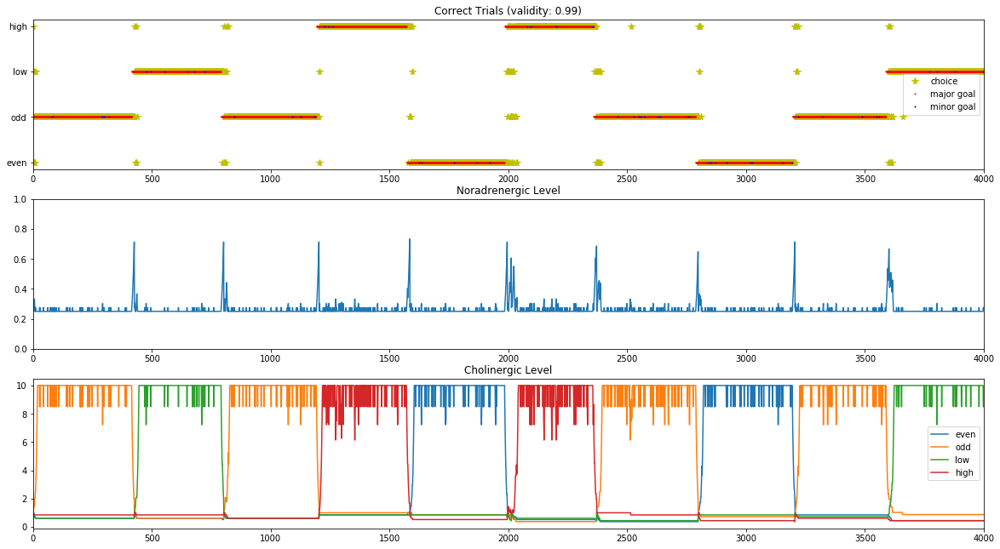

In [6]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
32/3999 = 0.8% trials occurred when the predicted digit matched the cued digit but the cue was invalid
601/3999 = 15.0% trials occurred when the predicted digit did not match the cued digit.
    350/3999 trials occurred when the predicted digit did not match the guess-target digit.
    276/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3366/3999 = 84.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [28 26 40 26 45 87 38 41 39 21], and mean of lag length (excluding consistently same cue) is 40.333333333333336


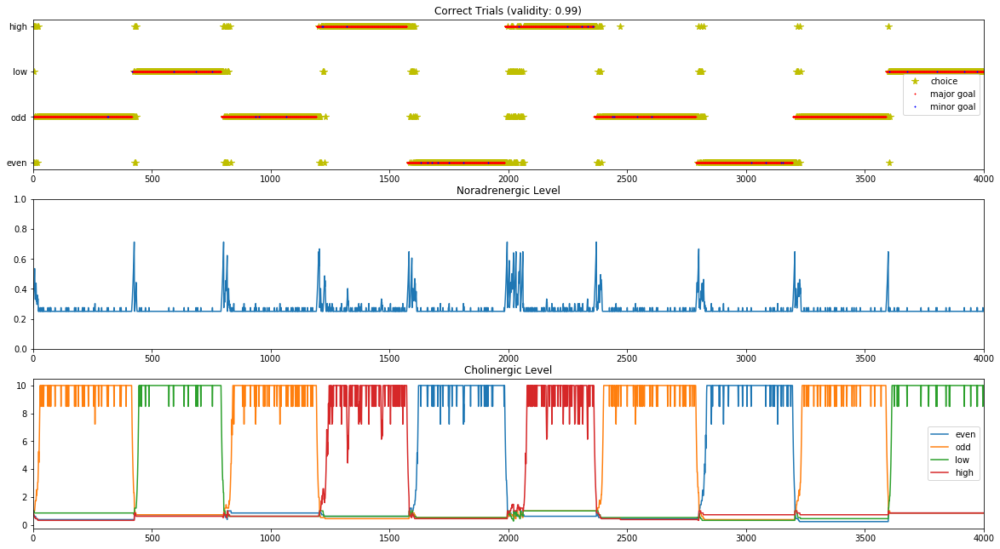

In [7]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
29/3999 = 0.7% trials occurred when the predicted digit matched the cued digit but the cue was invalid
525/3999 = 13.1% trials occurred when the predicted digit did not match the cued digit.
    328/3999 trials occurred when the predicted digit did not match the guess-target digit.
    213/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3445/3999 = 86.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [11 23 58 52 29 19 33 22 30 31], and mean of lag length (excluding consistently same cue) is 33.0


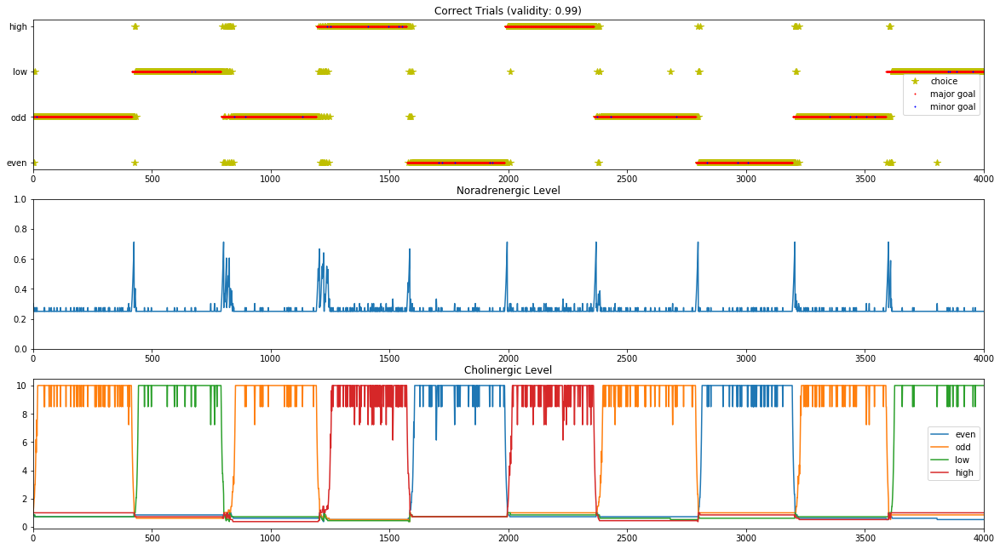

In [8]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
35/3999 = 0.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
552/3999 = 13.8% trials occurred when the predicted digit did not match the cued digit.
    388/3999 trials occurred when the predicted digit did not match the guess-target digit.
    193/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3412/3999 = 85.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [19 27 39 33 29 39 27 31 32 27], and mean of lag length (excluding consistently same cue) is 31.555555555555557


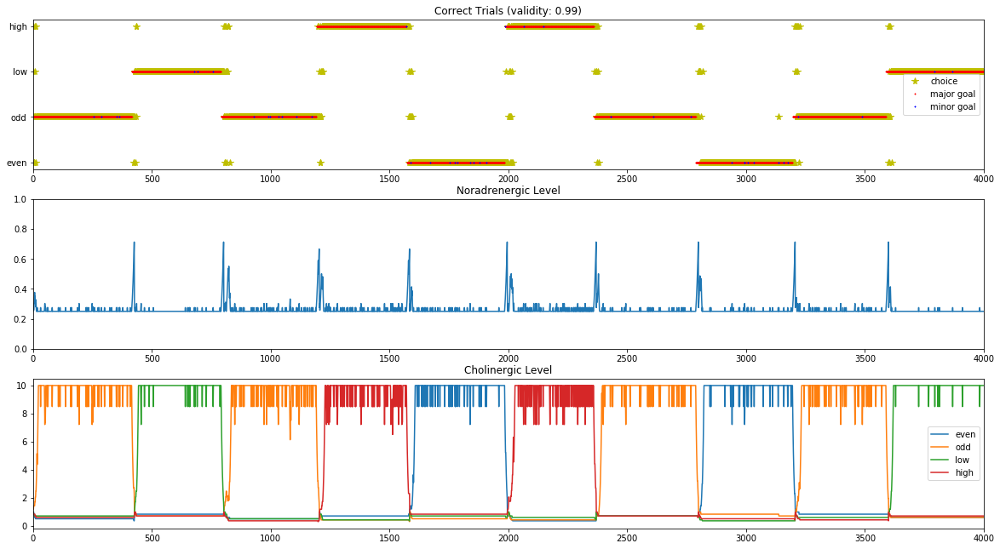

In [9]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
22/3999 = 0.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
568/3999 = 14.2% trials occurred when the predicted digit did not match the cued digit.
    370/3999 trials occurred when the predicted digit did not match the guess-target digit.
    219/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3409/3999 = 85.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [18 25 42 30 27 29 53 26 46 36], and mean of lag length (excluding consistently same cue) is 34.888888888888886


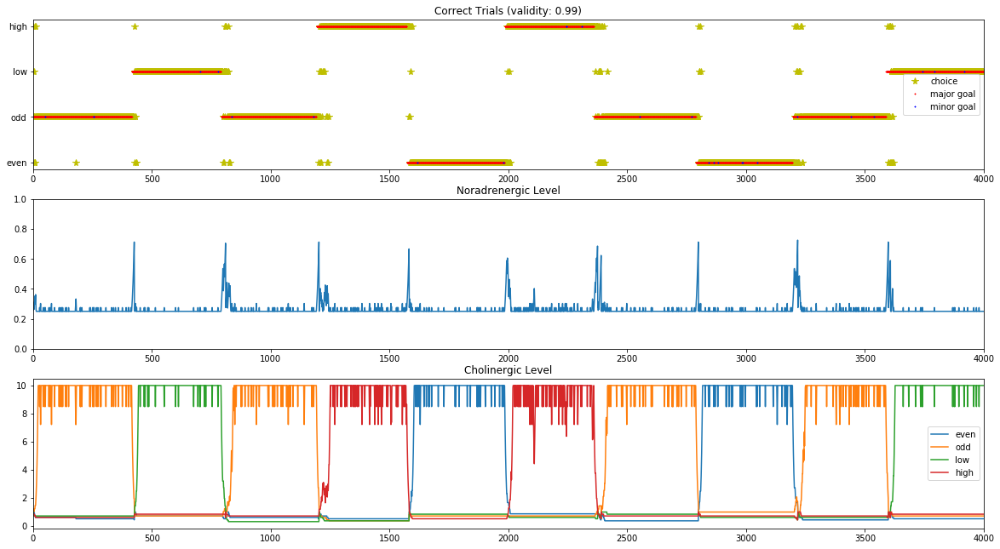

In [10]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
49/3999 = 1.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
563/3999 = 14.1% trials occurred when the predicted digit did not match the cued digit.
    372/3999 trials occurred when the predicted digit did not match the guess-target digit.
    213/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3387/3999 = 84.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [20 26 33 36 46 41 24 30 35 27], and mean of lag length (excluding consistently same cue) is 33.111111111111114


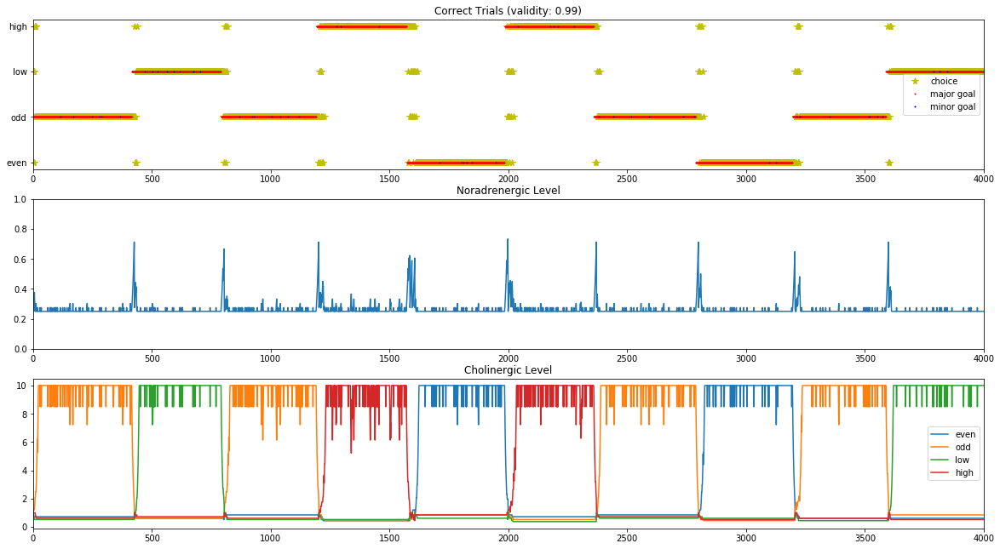

In [11]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
35/3999 = 0.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
564/3999 = 14.1% trials occurred when the predicted digit did not match the cued digit.
    346/3999 trials occurred when the predicted digit did not match the guess-target digit.
    238/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3400/3999 = 85.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [24 52 31 36 57 24 30 32 26 32], and mean of lag length (excluding consistently same cue) is 35.55555555555556


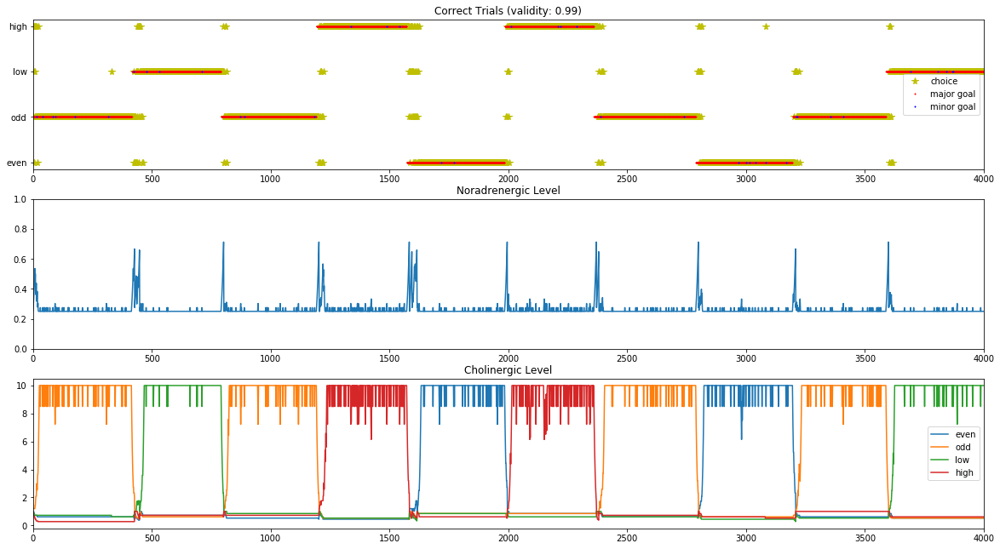

In [12]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
37/3999 = 0.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
583/3999 = 14.6% trials occurred when the predicted digit did not match the cued digit.
    369/3999 trials occurred when the predicted digit did not match the guess-target digit.
    240/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3379/3999 = 84.5% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [26 37 34 26 34 75 28 48 21 31], and mean of lag length (excluding consistently same cue) is 37.111111111111114


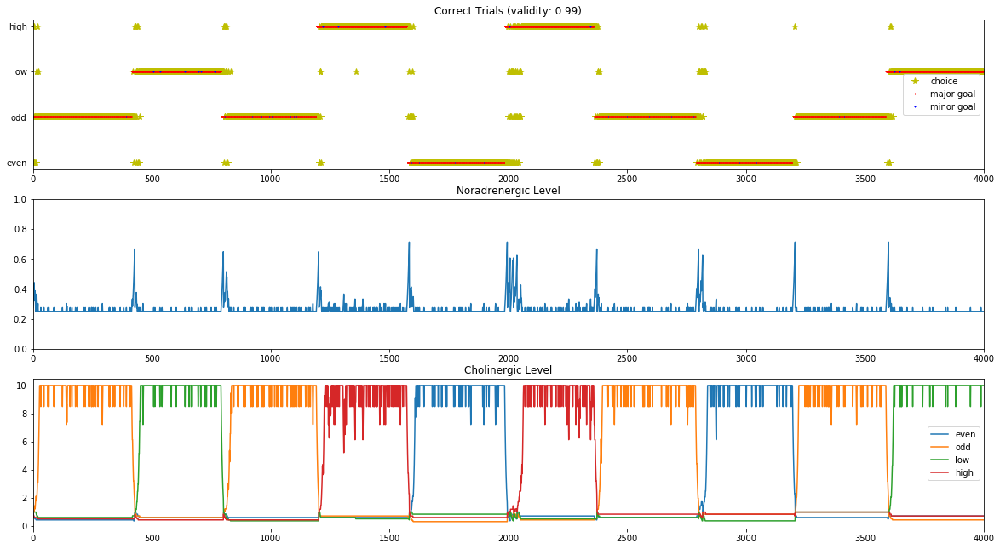

In [13]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
32/3999 = 0.8% trials occurred when the predicted digit matched the cued digit but the cue was invalid
587/3999 = 14.7% trials occurred when the predicted digit did not match the cued digit.
    347/3999 trials occurred when the predicted digit did not match the guess-target digit.
    256/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3380/3999 = 84.5% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [18 56 65 30 61 36 31 31 22 25], and mean of lag length (excluding consistently same cue) is 39.666666666666664


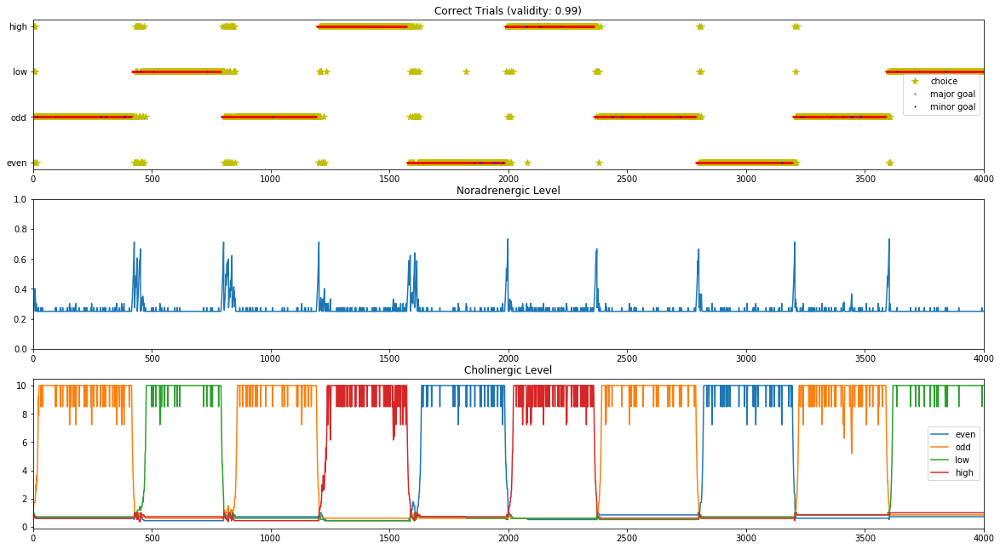

In [14]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


In [15]:
all_99_case_probs = [all_prob_99_1,all_prob_99_2,all_prob_99_3,all_prob_99_4,all_prob_99_5,\
                     all_prob_99_6,all_prob_99_7,all_prob_99_8,all_prob_99_9,all_prob_99_10]
averages_99 = average_probs(all_99_case_probs)


Average lag length is: 35
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.1410102525631408, 0.849887471867967, 0.0, 0.009102275568892223, 0.05628907226806702, 0.09014753688422107, 0.0]


### 4.1.2: validity_choices=0.85

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
514/3999 = 12.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
584/3999 = 14.6% trials occurred when the predicted digit did not match the cued digit.
    363/3999 trials occurred when the predicted digit did not match the guess-target digit.
    241/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2901/3999 = 72.5% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [11 49 52 32 35 41 26 27 25 47], and mean of lag length (excluding consistently same cue) is 37.111111111111114


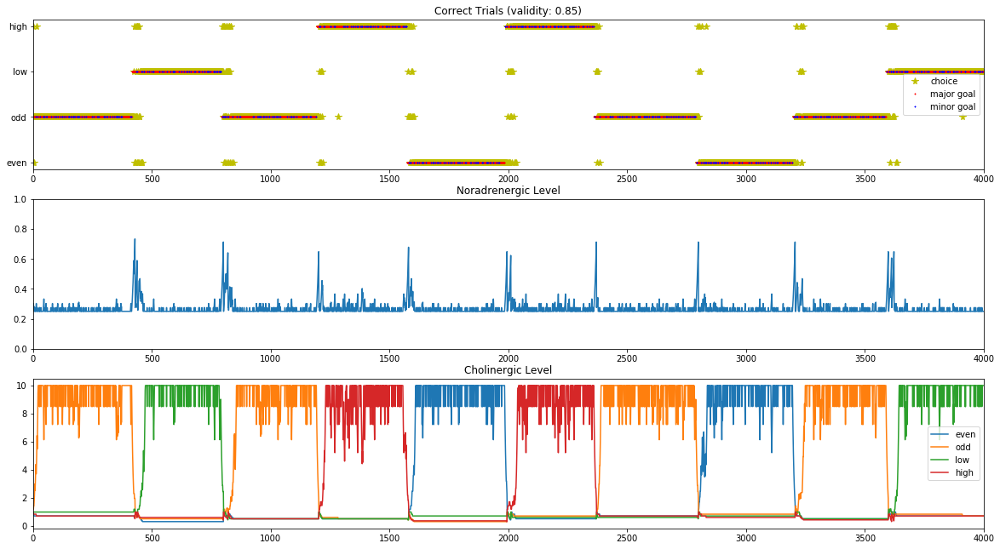

In [16]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
555/3999 = 13.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
601/3999 = 15.0% trials occurred when the predicted digit did not match the cued digit.
    390/3999 trials occurred when the predicted digit did not match the guess-target digit.
    238/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2843/3999 = 71.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [35 25 37 34 42 36 49 34 27 28], and mean of lag length (excluding consistently same cue) is 34.666666666666664


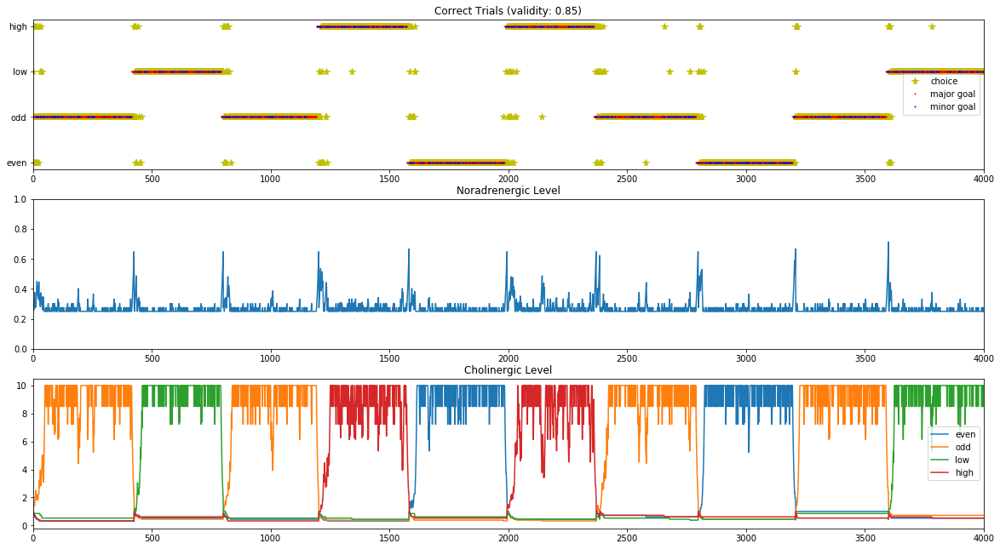

In [17]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
522/3999 = 13.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
646/3999 = 16.2% trials occurred when the predicted digit did not match the cued digit.
    351/3999 trials occurred when the predicted digit did not match the guess-target digit.
    324/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2831/3999 = 70.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [38 99 42 35 37 63 48 58 37 29], and mean of lag length (excluding consistently same cue) is 49.77777777777778


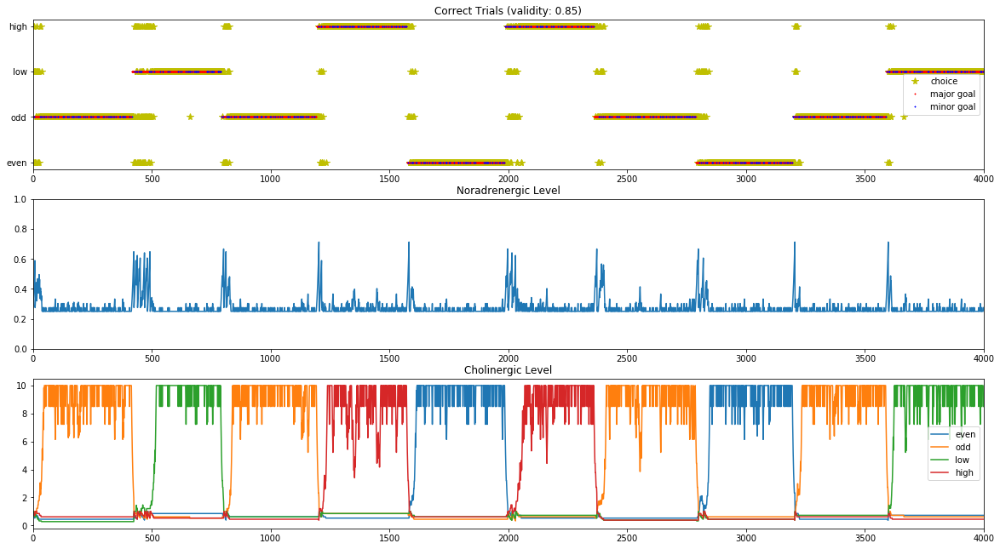

In [18]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
496/3999 = 12.4% trials occurred when the predicted digit matched the cued digit but the cue was invalid
616/3999 = 15.4% trials occurred when the predicted digit did not match the cued digit.
    349/3999 trials occurred when the predicted digit did not match the guess-target digit.
    291/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2887/3999 = 72.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [24 42 35 35 23 47 59 33 73 50], and mean of lag length (excluding consistently same cue) is 44.111111111111114


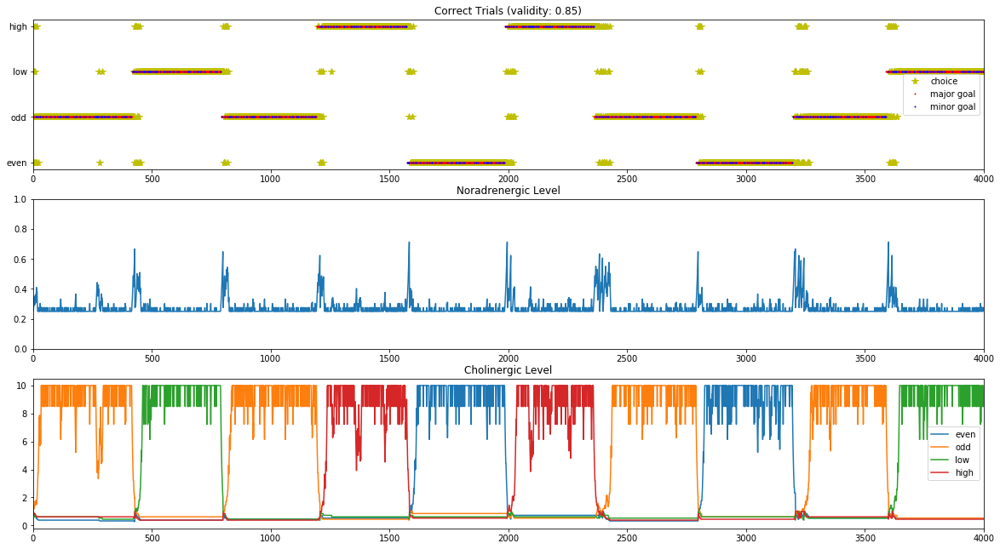

In [19]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
518/3999 = 13.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
588/3999 = 14.7% trials occurred when the predicted digit did not match the cued digit.
    370/3999 trials occurred when the predicted digit did not match the guess-target digit.
    247/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2893/3999 = 72.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [37 46 38 40 27 22 41 37 33 44], and mean of lag length (excluding consistently same cue) is 36.44444444444444


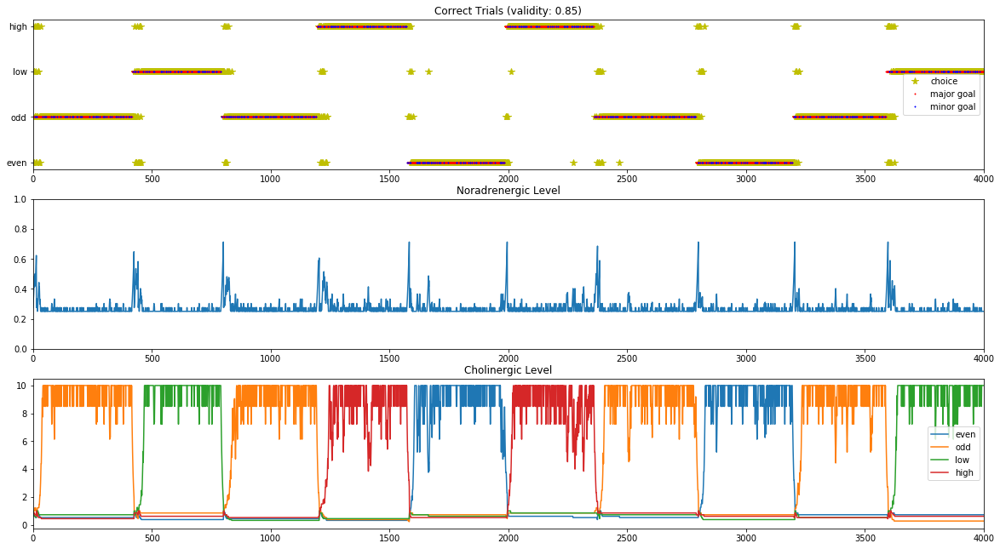

In [20]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
514/3999 = 12.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
583/3999 = 14.6% trials occurred when the predicted digit did not match the cued digit.
    348/3999 trials occurred when the predicted digit did not match the guess-target digit.
    257/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2902/3999 = 72.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [31 52 33 45 38 60 47 31 22 44], and mean of lag length (excluding consistently same cue) is 41.333333333333336


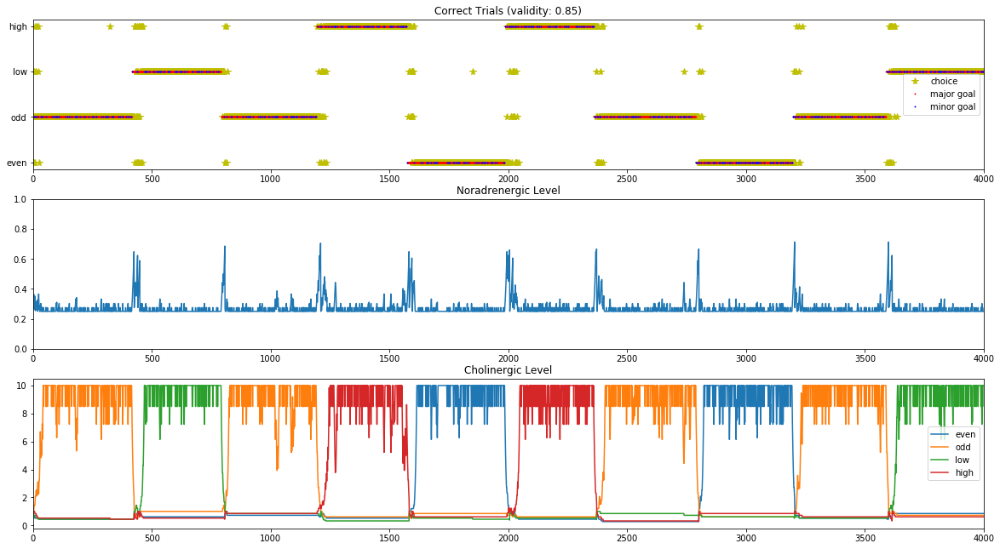

In [21]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
458/3999 = 11.5% trials occurred when the predicted digit matched the cued digit but the cue was invalid
628/3999 = 15.7% trials occurred when the predicted digit did not match the cued digit.
    358/3999 trials occurred when the predicted digit did not match the guess-target digit.
    300/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2913/3999 = 72.8% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [17 36 37 62 20 34 37 56 52 65], and mean of lag length (excluding consistently same cue) is 44.333333333333336


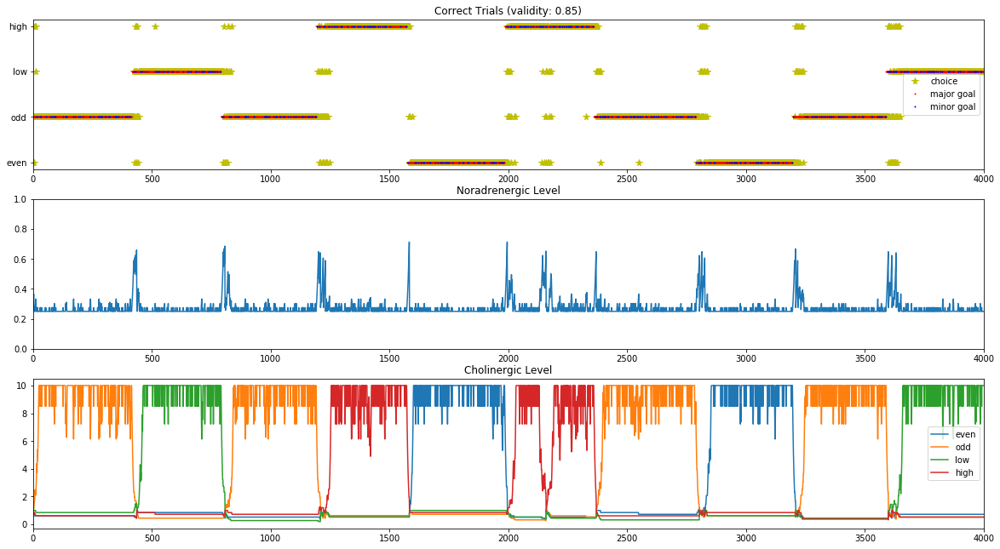

In [22]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
524/3999 = 13.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
622/3999 = 15.6% trials occurred when the predicted digit did not match the cued digit.
    372/3999 trials occurred when the predicted digit did not match the guess-target digit.
    277/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2853/3999 = 71.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [38 68 28 36 24 88 24 36 23 43], and mean of lag length (excluding consistently same cue) is 41.111111111111114


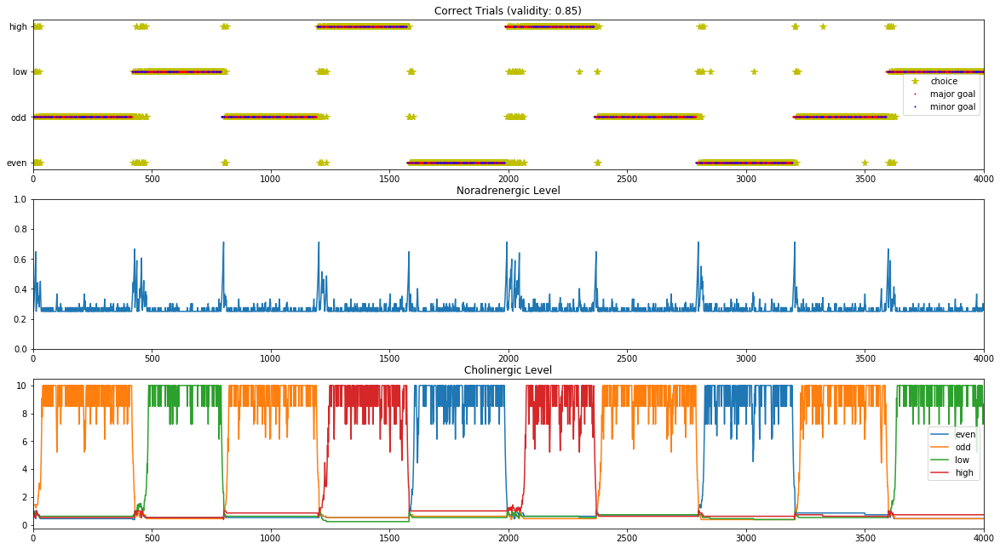

In [23]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
480/3999 = 12.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
620/3999 = 15.5% trials occurred when the predicted digit did not match the cued digit.
    363/3999 trials occurred when the predicted digit did not match the guess-target digit.
    282/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2899/3999 = 72.5% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [28 70 96 22 29 49 35 32 31 36], and mean of lag length (excluding consistently same cue) is 44.44444444444444


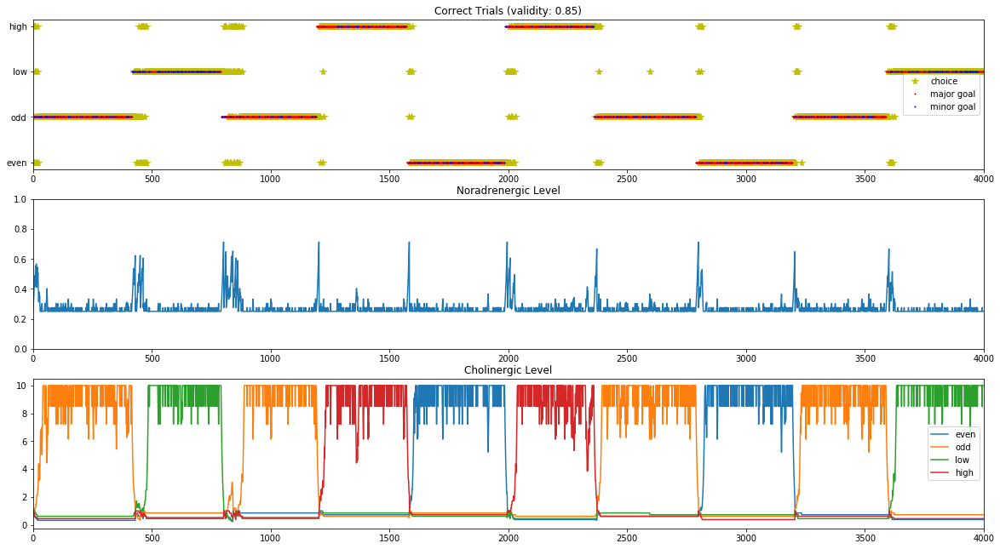

In [24]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
526/3999 = 13.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
595/3999 = 14.9% trials occurred when the predicted digit did not match the cued digit.
    355/3999 trials occurred when the predicted digit did not match the guess-target digit.
    269/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2878/3999 = 72.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [47 48 67 25 38 35 27 32 35 40], and mean of lag length (excluding consistently same cue) is 38.55555555555556


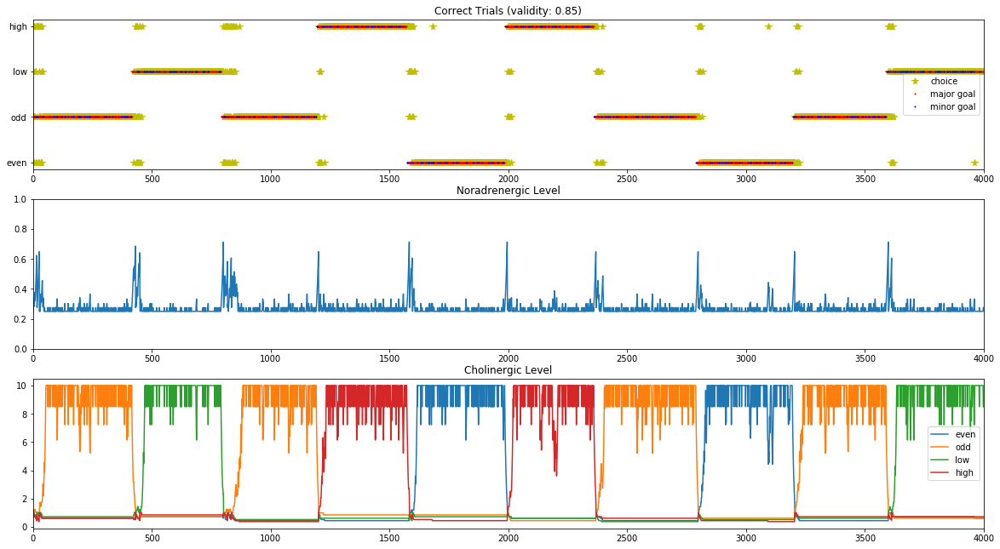

In [25]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


In [26]:
all_85_case_probs = [all_prob_85_1,all_prob_85_2,all_prob_85_3,all_prob_85_4,all_prob_85_5,\
                     all_prob_85_6,all_prob_85_7,all_prob_85_8,all_prob_85_9,all_prob_85_10]
averages_85 = average_probs(all_85_case_probs)


Average lag length is: 41
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.15211302825706427, 0.7201800450112528, 0.0, 0.12770692673168288, 0.06816704176044011, 0.09049762440610151, 0.0]


### 4.1.3: validity_choices=0.7

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
967/3999 = 24.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
808/3999 = 20.2% trials occurred when the predicted digit did not match the cued digit.
    354/3999 trials occurred when the predicted digit did not match the guess-target digit.
    502/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2224/3999 = 55.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 50  45  85  35  37  39 106  38  46  61], and mean of lag length (excluding consistently same cue) is 54.666666666666664


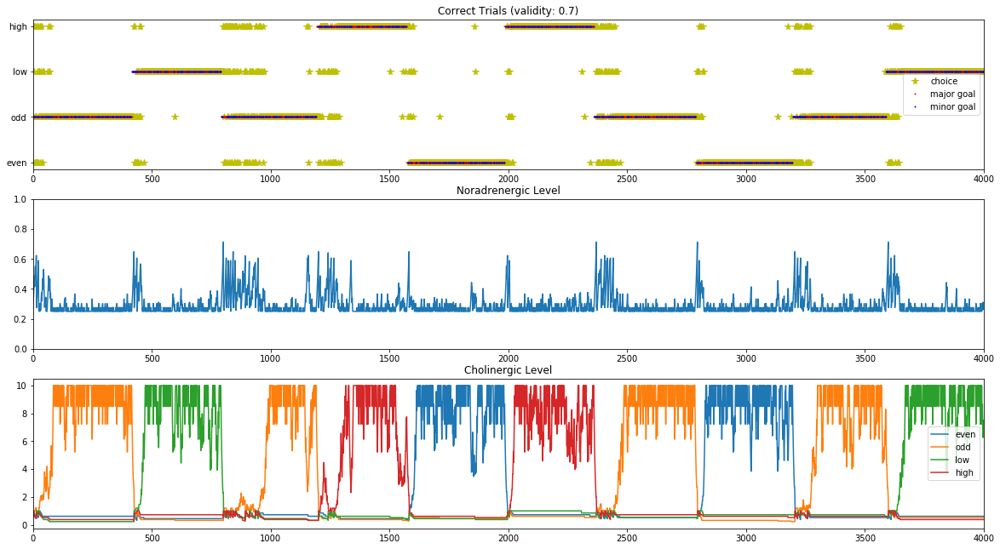

In [27]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
874/3999 = 21.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1091/3999 = 27.3% trials occurred when the predicted digit did not match the cued digit.
    363/3999 trials occurred when the predicted digit did not match the guess-target digit.
    797/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2034/3999 = 50.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 19 151  23  29  49 118  28  28 261  37], and mean of lag length (excluding consistently same cue) is 80.44444444444444


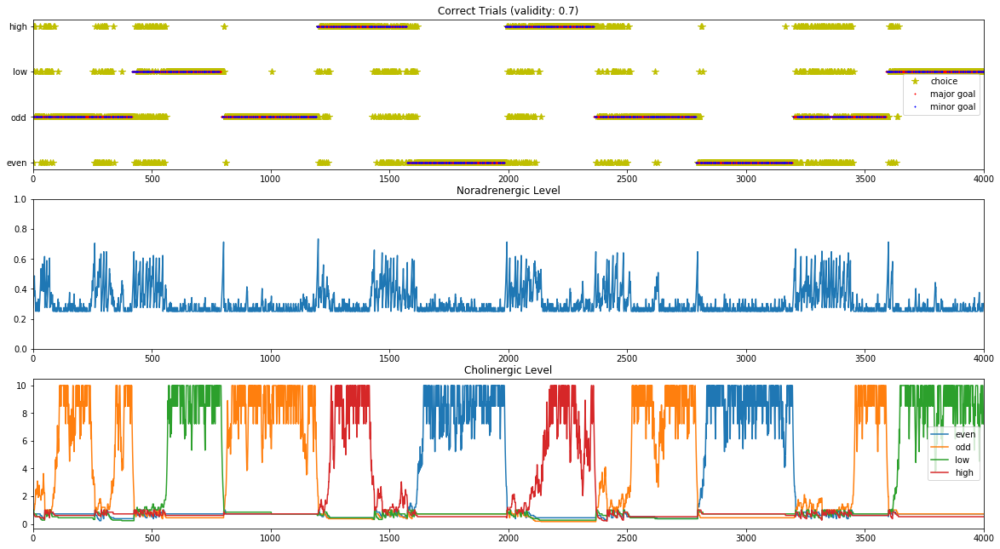

In [28]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
898/3999 = 22.5% trials occurred when the predicted digit matched the cued digit but the cue was invalid
945/3999 = 23.6% trials occurred when the predicted digit did not match the cued digit.
    351/3999 trials occurred when the predicted digit did not match the guess-target digit.
    648/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2156/3999 = 53.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [125  75  51 120  32 117  40  56  67  56], and mean of lag length (excluding consistently same cue) is 68.22222222222223


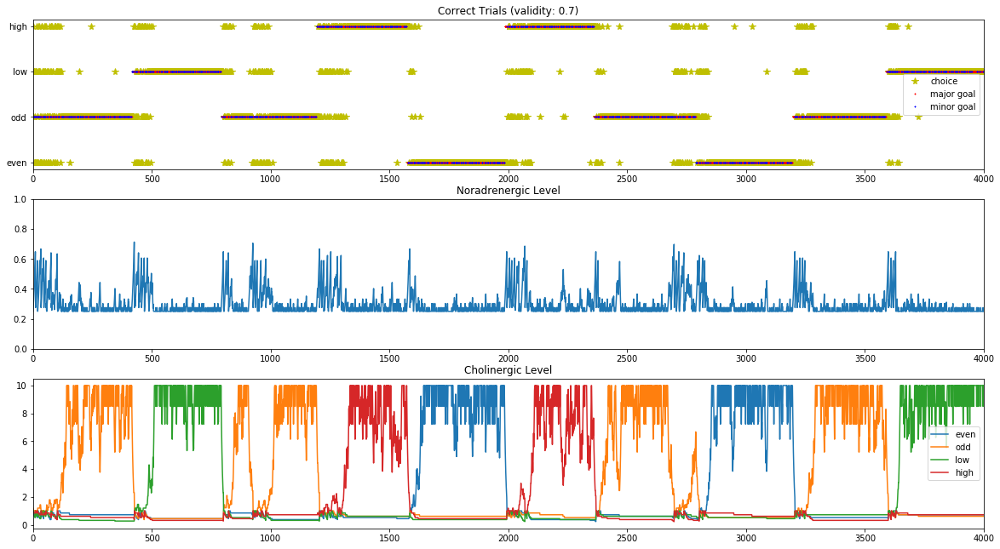

In [29]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
882/3999 = 22.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
959/3999 = 24.0% trials occurred when the predicted digit did not match the cued digit.
    363/3999 trials occurred when the predicted digit did not match the guess-target digit.
    646/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2158/3999 = 54.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 61  68  32  54  25  90  35 116 112  93], and mean of lag length (excluding consistently same cue) is 69.44444444444444


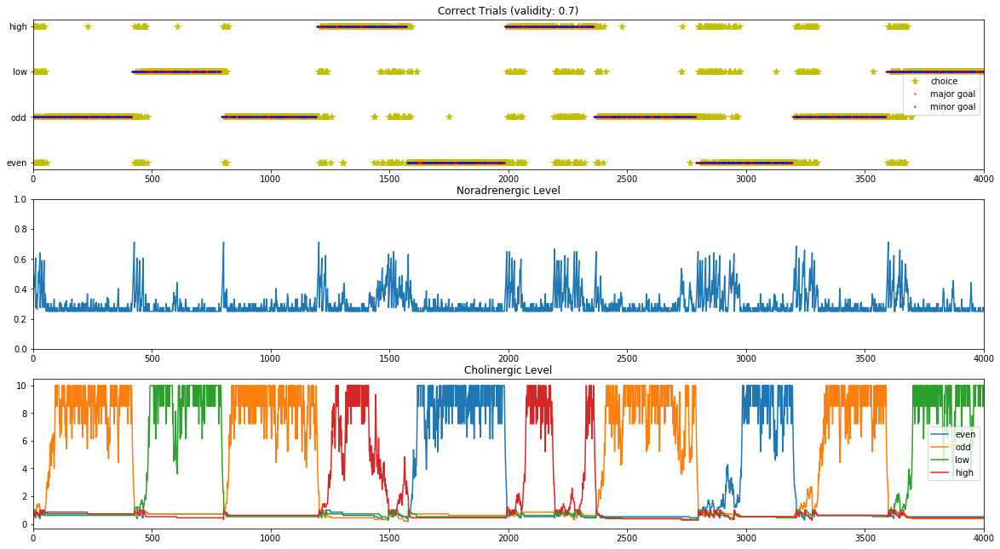

In [30]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
900/3999 = 22.5% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1055/3999 = 26.4% trials occurred when the predicted digit did not match the cued digit.
    376/3999 trials occurred when the predicted digit did not match the guess-target digit.
    761/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2044/3999 = 51.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 21 149  69 122 103  77  40 145  34 141], and mean of lag length (excluding consistently same cue) is 97.77777777777777


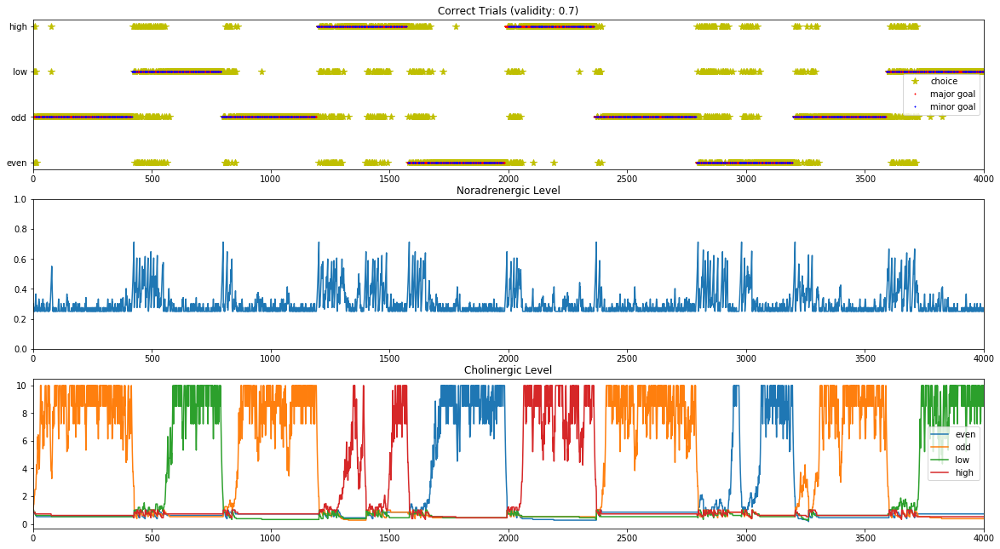

In [31]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
942/3999 = 23.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
809/3999 = 20.2% trials occurred when the predicted digit did not match the cued digit.
    351/3999 trials occurred when the predicted digit did not match the guess-target digit.
    494/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2248/3999 = 56.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 94  78  55  47  39  37 108  64  39  40], and mean of lag length (excluding consistently same cue) is 56.333333333333336


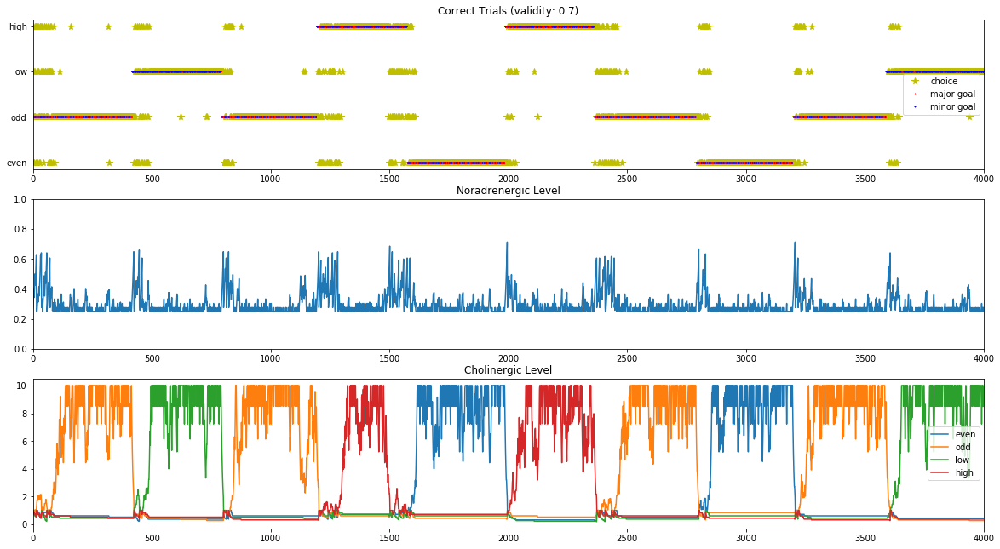

In [32]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
922/3999 = 23.1% trials occurred when the predicted digit matched the cued digit but the cue was invalid
871/3999 = 21.8% trials occurred when the predicted digit did not match the cued digit.
    330/3999 trials occurred when the predicted digit did not match the guess-target digit.
    598/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2206/3999 = 55.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [124  45  26  75  44 126  65 213  29  47], and mean of lag length (excluding consistently same cue) is 74.44444444444444


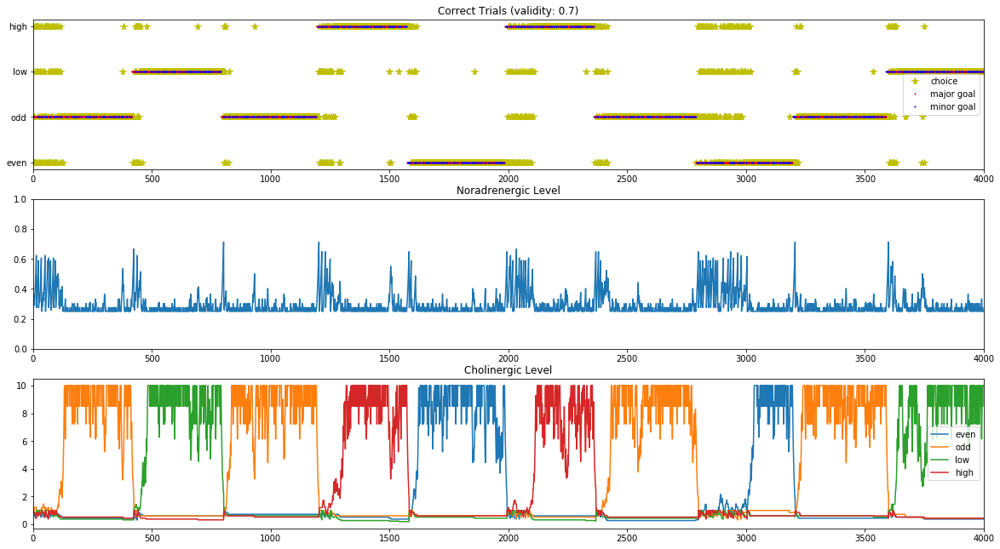

In [33]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
868/3999 = 21.7% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1017/3999 = 25.4% trials occurred when the predicted digit did not match the cued digit.
    324/3999 trials occurred when the predicted digit did not match the guess-target digit.
    764/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2114/3999 = 52.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 58  24  82  93  52  81 226  44  33  33], and mean of lag length (excluding consistently same cue) is 74.22222222222223


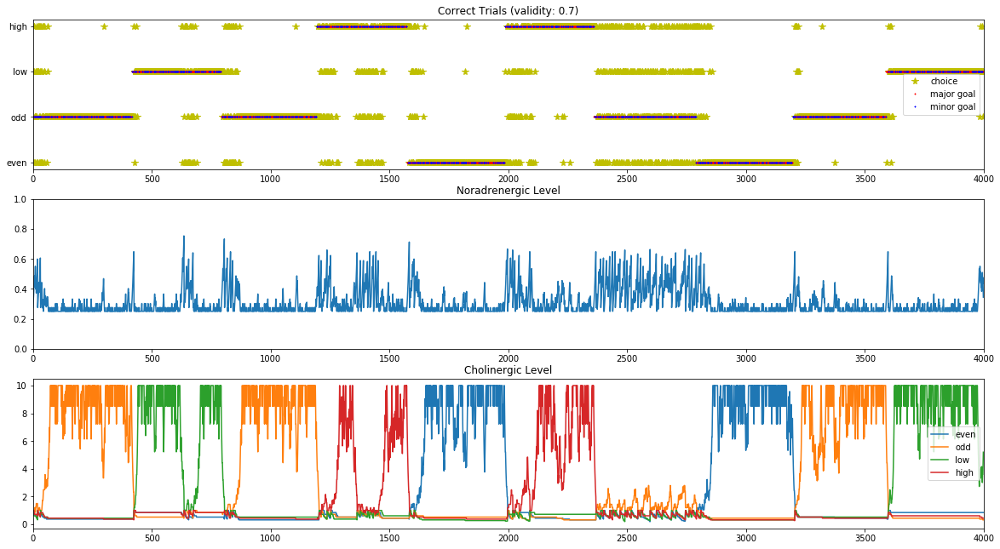

In [34]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
927/3999 = 23.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1070/3999 = 26.8% trials occurred when the predicted digit did not match the cued digit.
    322/3999 trials occurred when the predicted digit did not match the guess-target digit.
    800/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2002/3999 = 50.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 51  36  24 254  98 212 110  33  41  85], and mean of lag length (excluding consistently same cue) is 99.22222222222223


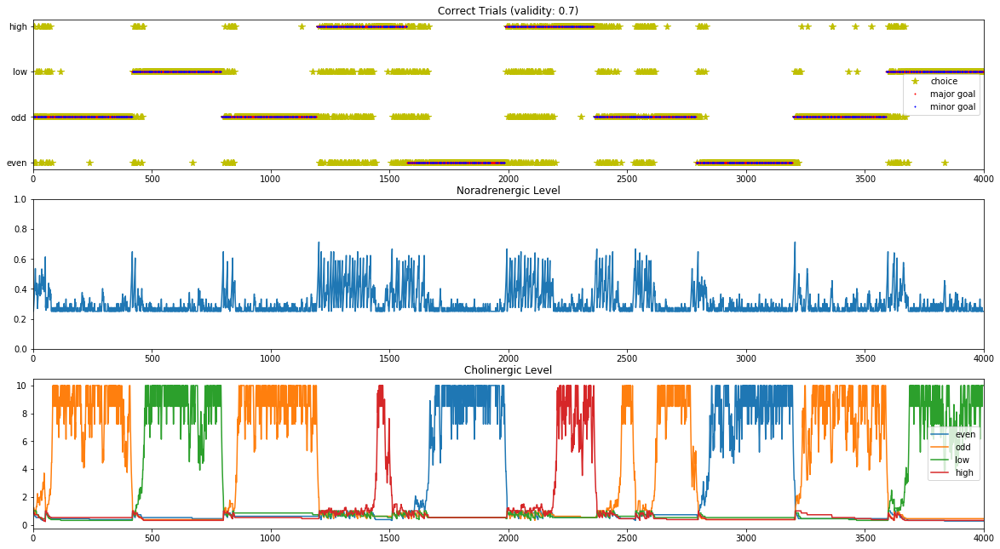

In [35]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
926/3999 = 23.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
815/3999 = 20.4% trials occurred when the predicted digit did not match the cued digit.
    374/3999 trials occurred when the predicted digit did not match the guess-target digit.
    498/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2258/3999 = 56.5% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [134  41  28 106  51  43  41  35 118 104], and mean of lag length (excluding consistently same cue) is 63.0


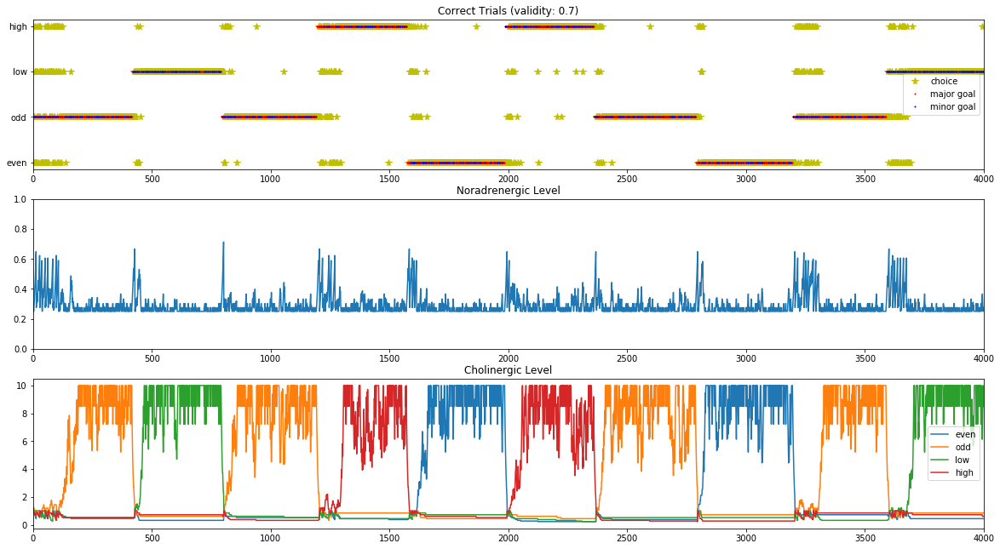

In [36]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


In [37]:
all_70_case_probs = [all_prob_70_1,all_prob_70_2,all_prob_70_3,all_prob_70_4,all_prob_70_5,\
                     all_prob_70_6,all_prob_70_7,all_prob_70_8,all_prob_70_9,all_prob_70_10]
averages_70 = average_probs(all_70_case_probs)


Average lag length is: 73
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.23605901475368843, 0.5362340585146287, 0.0, 0.22770692673168297, 0.1627406851712928, 0.08772193048262064, 0.0]


### 4.1.4: validity_choices=[0.99, 0.85, 0.70]

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
369/3999 = 9.2% trials occurred when the predicted digit matched the cued digit but the cue was invalid
687/3999 = 17.2% trials occurred when the predicted digit did not match the cued digit.
    368/3999 trials occurred when the predicted digit did not match the guess-target digit.
    350/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2943/3999 = 73.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [30 75 67 83 41 25 20 76 52 40], and mean of lag length (excluding consistently same cue) is 53.22222222222222


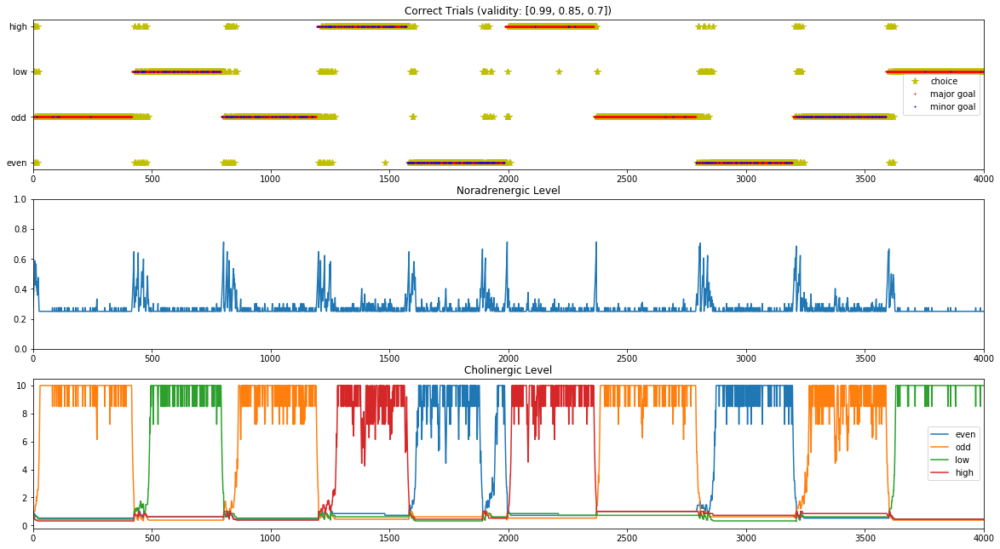

In [38]:
# trialRange+/-30 and single valid cue (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
493/3999 = 12.3% trials occurred when the predicted digit matched the cued digit but the cue was invalid
647/3999 = 16.2% trials occurred when the predicted digit did not match the cued digit.
    363/3999 trials occurred when the predicted digit did not match the guess-target digit.
    318/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2859/3999 = 71.5% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [17 30 81 83 39 54 57 25 45 38], and mean of lag length (excluding consistently same cue) is 50.22222222222222


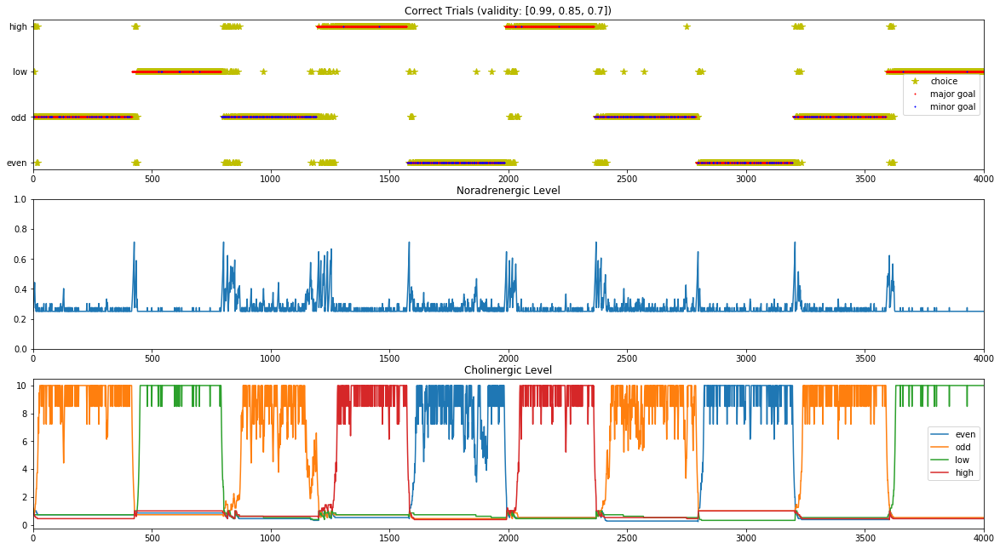

In [39]:
# trialRange+/-30 and single valid cue (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
437/3999 = 10.9% trials occurred when the predicted digit matched the cued digit but the cue was invalid
586/3999 = 14.7% trials occurred when the predicted digit did not match the cued digit.
    344/3999 trials occurred when the predicted digit did not match the guess-target digit.
    265/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2976/3999 = 74.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [23 72 35 47 30 64 29 29 21 50], and mean of lag length (excluding consistently same cue) is 41.888888888888886


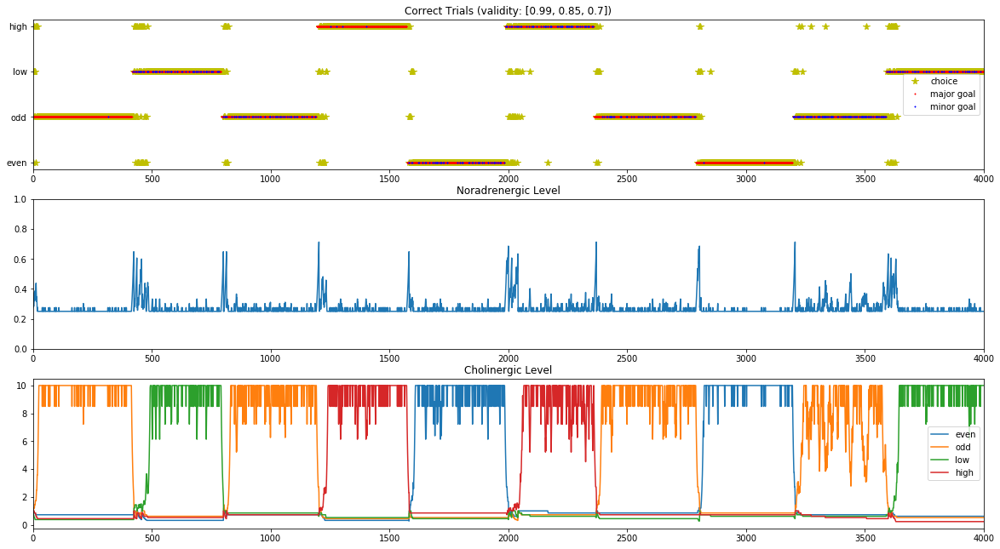

In [40]:
# trialRange+/-30 and single valid cue (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
503/3999 = 12.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
712/3999 = 17.8% trials occurred when the predicted digit did not match the cued digit.
    380/3999 trials occurred when the predicted digit did not match the guess-target digit.
    379/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2784/3999 = 69.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [119  25  19  51  54  33  46  80  15  28], and mean of lag length (excluding consistently same cue) is 39.0


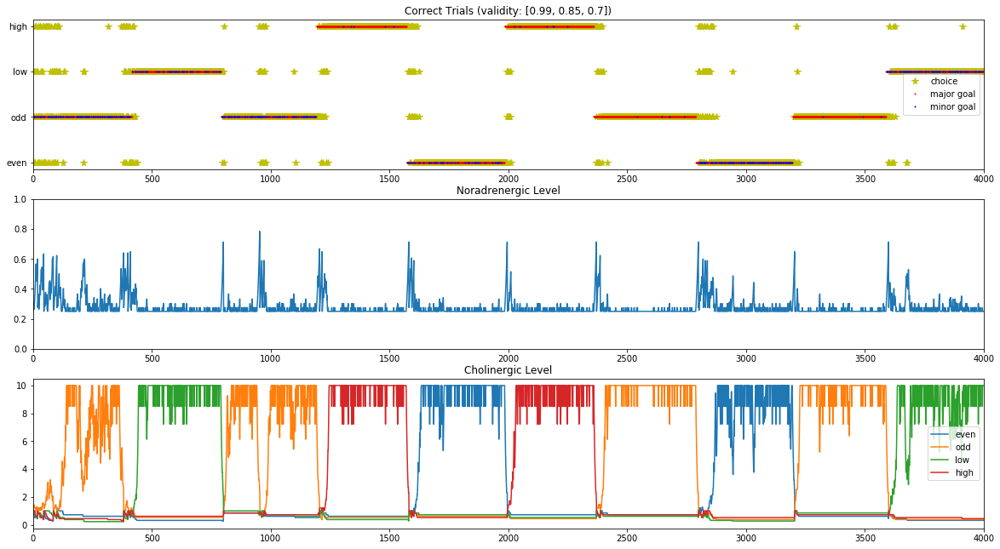

In [41]:
# trialRange+/-30 and single valid cue (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
344/3999 = 8.6% trials occurred when the predicted digit matched the cued digit but the cue was invalid
614/3999 = 15.4% trials occurred when the predicted digit did not match the cued digit.
    335/3999 trials occurred when the predicted digit did not match the guess-target digit.
    310/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3041/3999 = 76.0% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [11 41 55 24 50 71 42 75 61 26], and mean of lag length (excluding consistently same cue) is 49.44444444444444


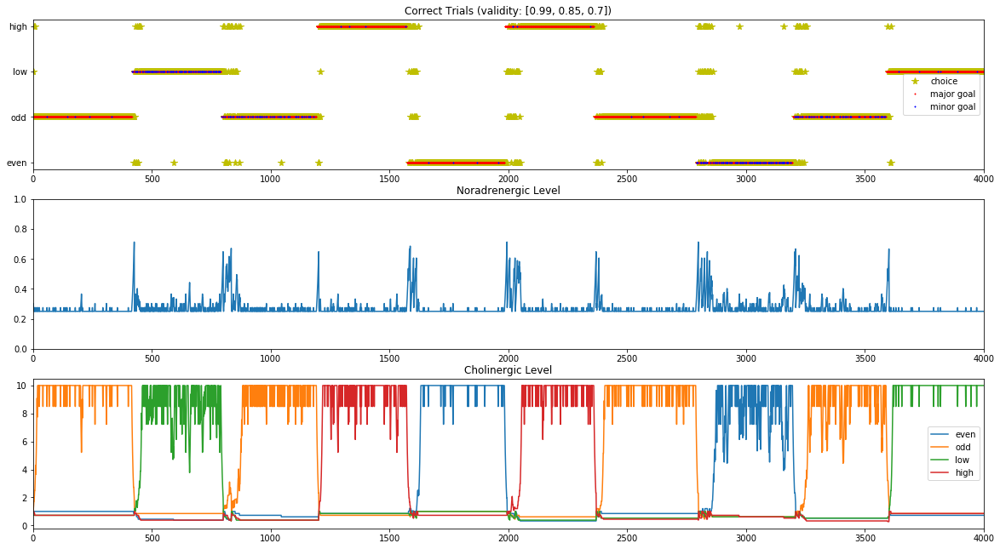

In [42]:
# trialRange+/-30 and single valid cue (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
374/3999 = 9.4% trials occurred when the predicted digit matched the cued digit but the cue was invalid
620/3999 = 15.5% trials occurred when the predicted digit did not match the cued digit.
    352/3999 trials occurred when the predicted digit did not match the guess-target digit.
    293/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3005/3999 = 75.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [19 27 34 93 27 48 27 67 33 35], and mean of lag length (excluding consistently same cue) is 43.44444444444444


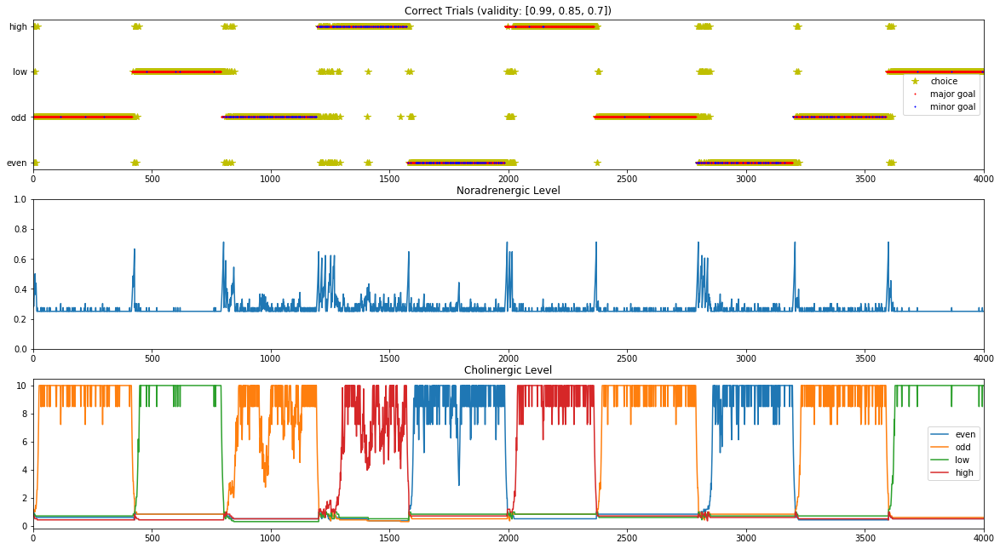

In [43]:
# trialRange+/-30 and single valid cue (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
551/3999 = 13.8% trials occurred when the predicted digit matched the cued digit but the cue was invalid
804/3999 = 20.1% trials occurred when the predicted digit did not match the cued digit.
    299/3999 trials occurred when the predicted digit did not match the guess-target digit.
    552/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2644/3999 = 66.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 63  49 112 178  97  58  25  69  33  31], and mean of lag length (excluding consistently same cue) is 72.44444444444444


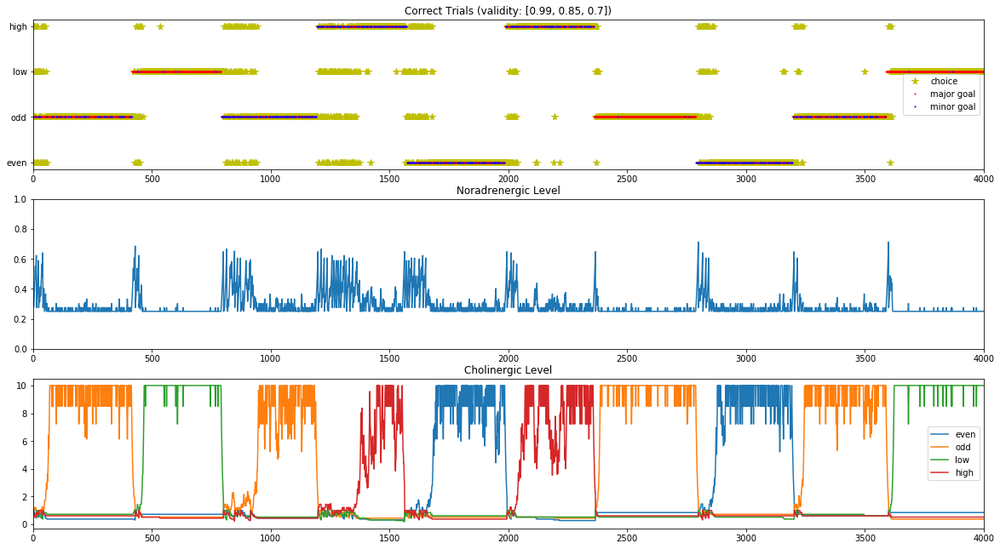

In [44]:
# trialRange+/-30 and single valid cue (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
358/3999 = 9.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
775/3999 = 19.4% trials occurred when the predicted digit did not match the cued digit.
    362/3999 trials occurred when the predicted digit did not match the guess-target digit.
    456/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2866/3999 = 71.7% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [ 16  32 131 142  26  34  40  39  29  30], and mean of lag length (excluding consistently same cue) is 55.888888888888886


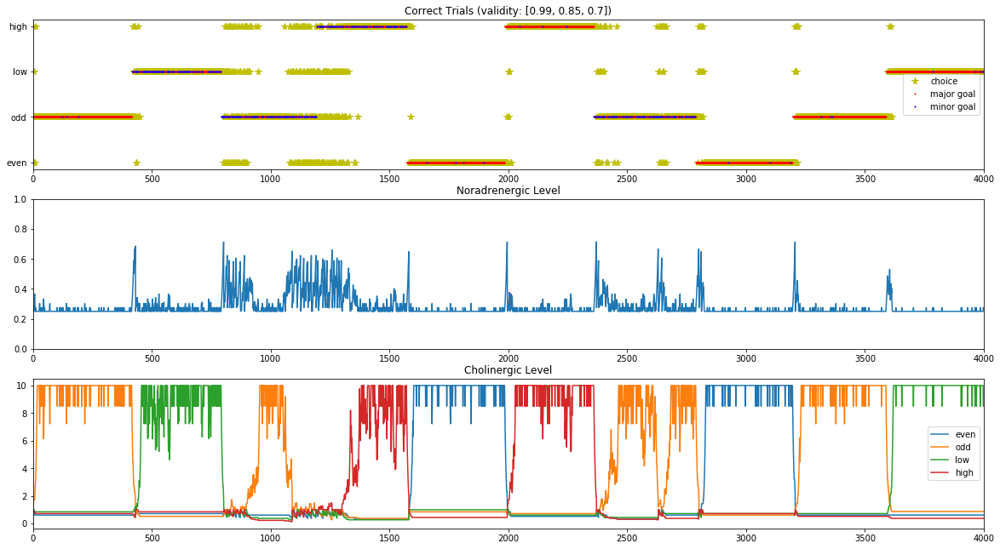

In [45]:
# trialRange+/-30 and single valid cue (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
611/3999 = 15.3% trials occurred when the predicted digit matched the cued digit but the cue was invalid
698/3999 = 17.5% trials occurred when the predicted digit did not match the cued digit.
    324/3999 trials occurred when the predicted digit did not match the guess-target digit.
    405/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2690/3999 = 67.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [30 80 34 56 30 61 59 22 29 20], and mean of lag length (excluding consistently same cue) is 43.44444444444444


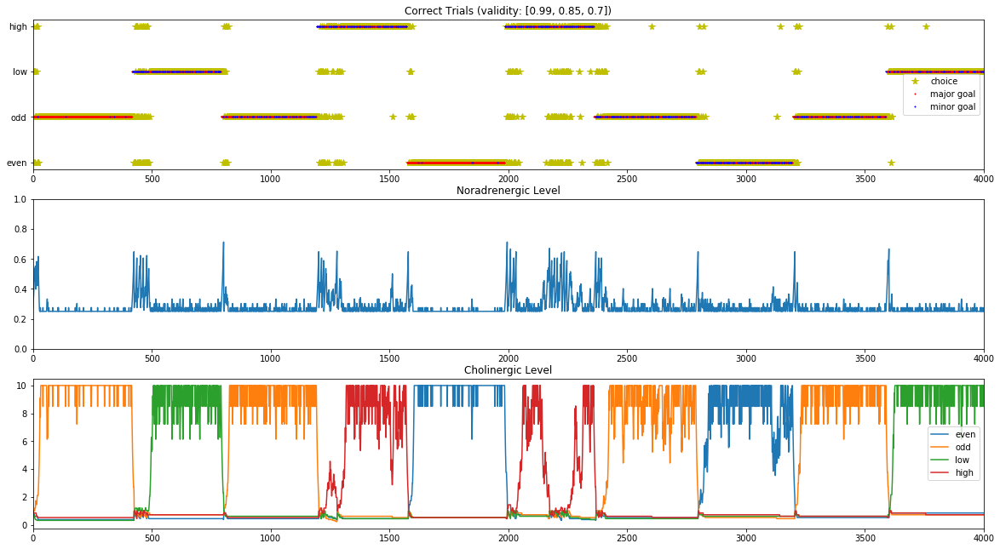

In [46]:
# trialRange+/-30 and single valid cue (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
461/3999 = 11.5% trials occurred when the predicted digit matched the cued digit but the cue was invalid
687/3999 = 17.2% trials occurred when the predicted digit did not match the cued digit.
    330/3999 trials occurred when the predicted digit did not match the guess-target digit.
    389/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2851/3999 = 71.3% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
Lag length for stable prediction of each major cue is: [92 32 35 96 28 37 77 30 53 34], and mean of lag length (excluding consistently same cue) is 46.888888888888886


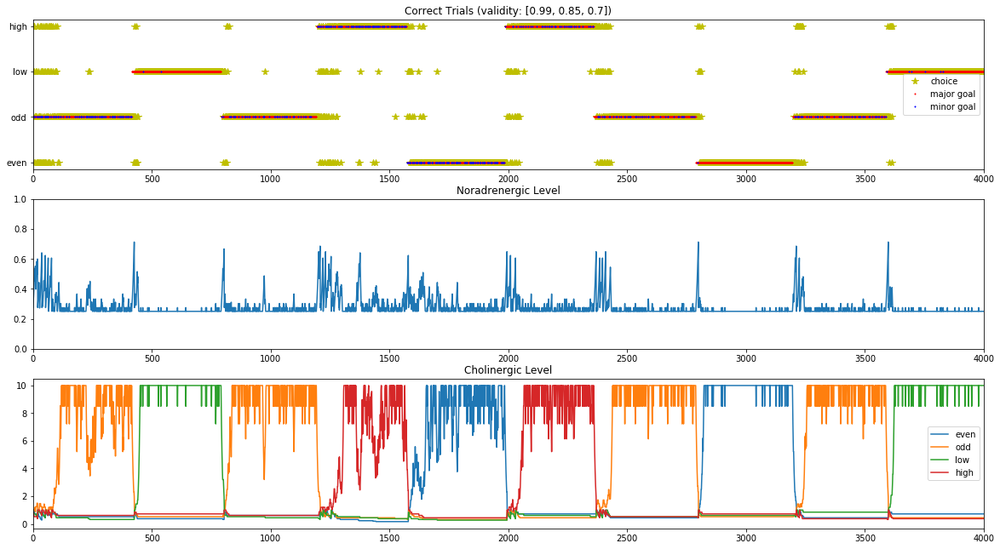

In [47]:
# trialRange+/-30 and single valid cue (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multi_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


In [48]:
all_multi_case_probs = [all_prob_multi_1,all_prob_multi_2,all_prob_multi_3,all_prob_multi_4,all_prob_multi_5,\
                        all_prob_multi_6,all_prob_multi_7,all_prob_multi_8,all_prob_multi_9,all_prob_multi_10]
averages_multi = average_probs(all_multi_case_probs)


Average lag length is: 49
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.17079269817454362, 0.7166541635408853, 0.0, 0.11255313828457114, 0.09294823705926483, 0.08644661165291323, 0.0]


## 4.2: Two Possibly Valid Cues
Randomly change trial interval within the range (200+/-20) and have two possibly valid cues for each cue switch, and use one of the validity options: 0.99, 0.85, 0.70

In [49]:
alterValid=True

### 4.2.1: validity_choices=0.99

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
602/3999 = 15.1% trials occurred when the predicted digit did not match the cued digit.
    360/3999 trials occurred when the predicted digit did not match the guess-target digit.
    268/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3397/3999 = 84.9% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
45/3999 = 1.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

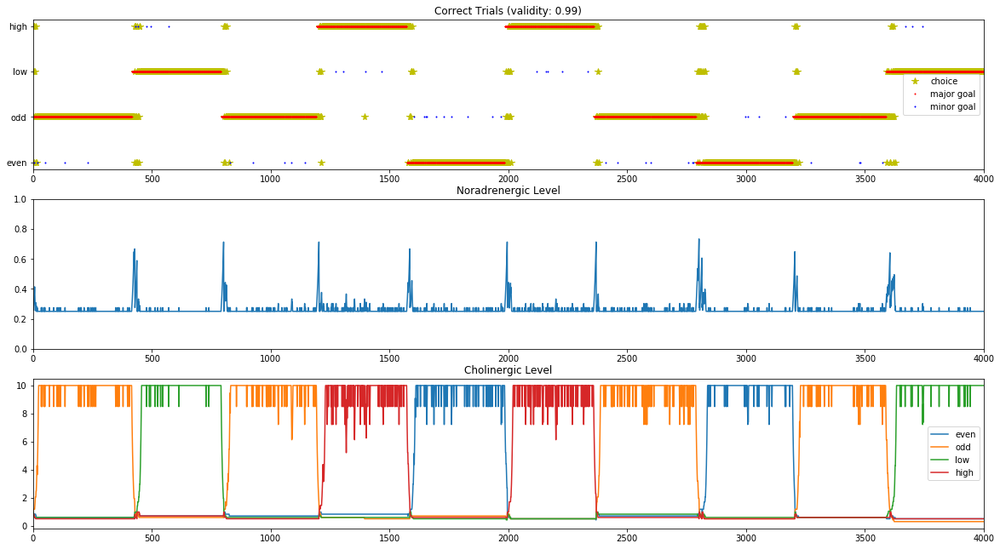

In [50]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_1a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
574/3999 = 14.4% trials occurred when the predicted digit did not match the cued digit.
    342/3999 trials occurred when the predicted digit did not match the guess-target digit.
    248/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3425/3999 = 85.6% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
28/3999 = 0.7% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

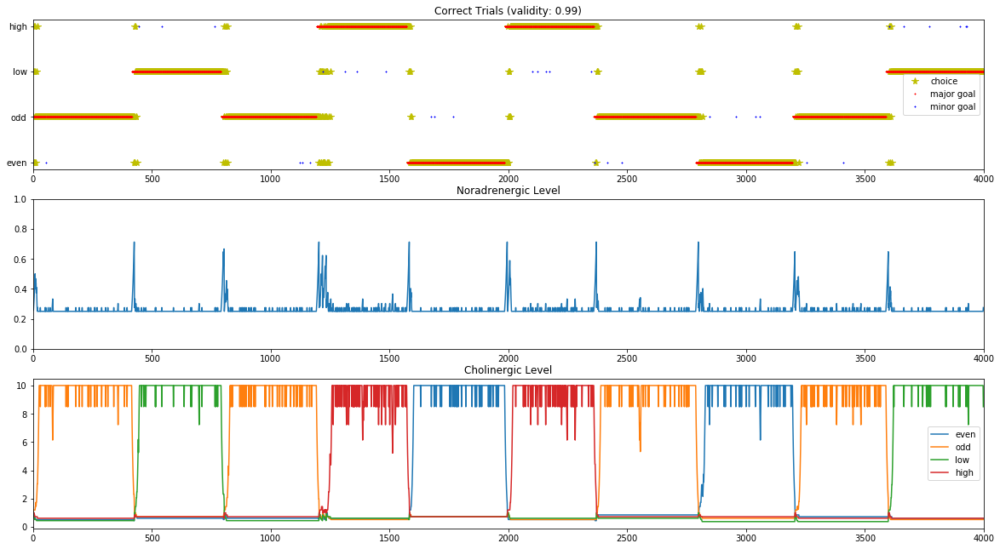

In [51]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_2a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
572/3999 = 14.3% trials occurred when the predicted digit did not match the cued digit.
    349/3999 trials occurred when the predicted digit did not match the guess-target digit.
    245/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3425/3999 = 85.6% trials occurred when the predicted digit matches the major cued digit and is valid
2/3999 = 0.1% trials occurred when the predicted digit matches the minor cued digit and is valid
39/3999 = 1.0% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

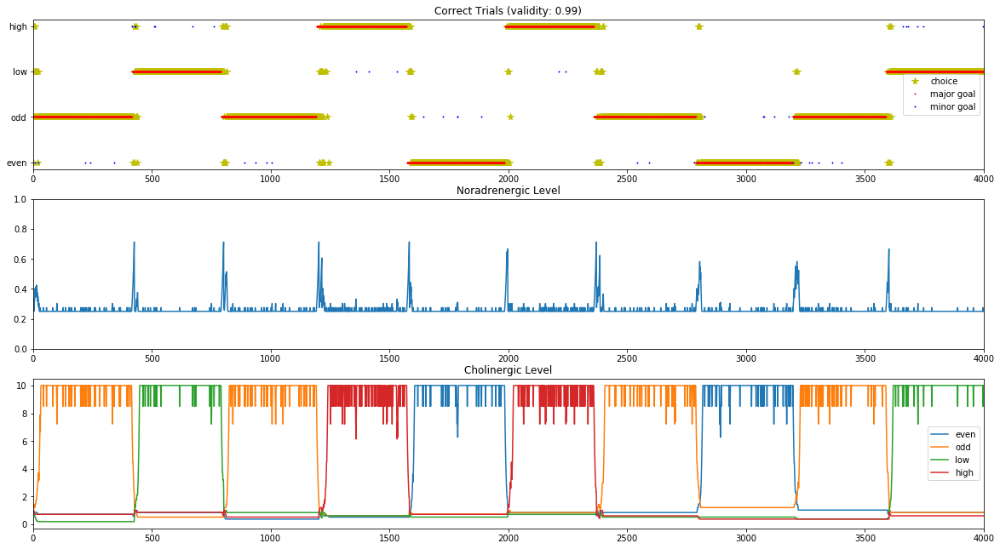

In [52]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_3a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
558/3999 = 14.0% trials occurred when the predicted digit did not match the cued digit.
    323/3999 trials occurred when the predicted digit did not match the guess-target digit.
    255/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3439/3999 = 86.0% trials occurred when the predicted digit matches the major cued digit and is valid
2/3999 = 0.1% trials occurred when the predicted digit matches the minor cued digit and is valid
45/3999 = 1.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

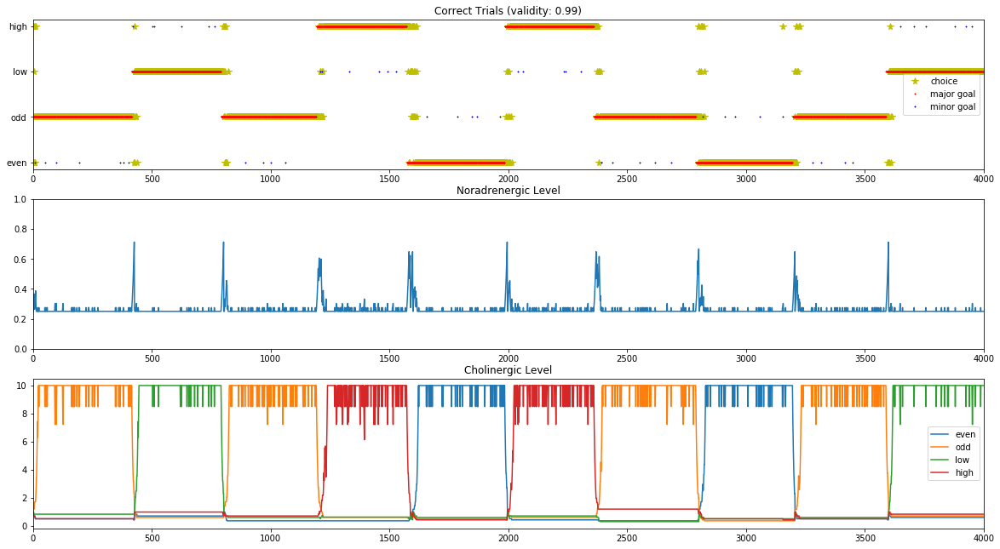

In [53]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_4a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
542/3999 = 13.6% trials occurred when the predicted digit did not match the cued digit.
    333/3999 trials occurred when the predicted digit did not match the guess-target digit.
    236/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3457/3999 = 86.4% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
28/3999 = 0.7% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

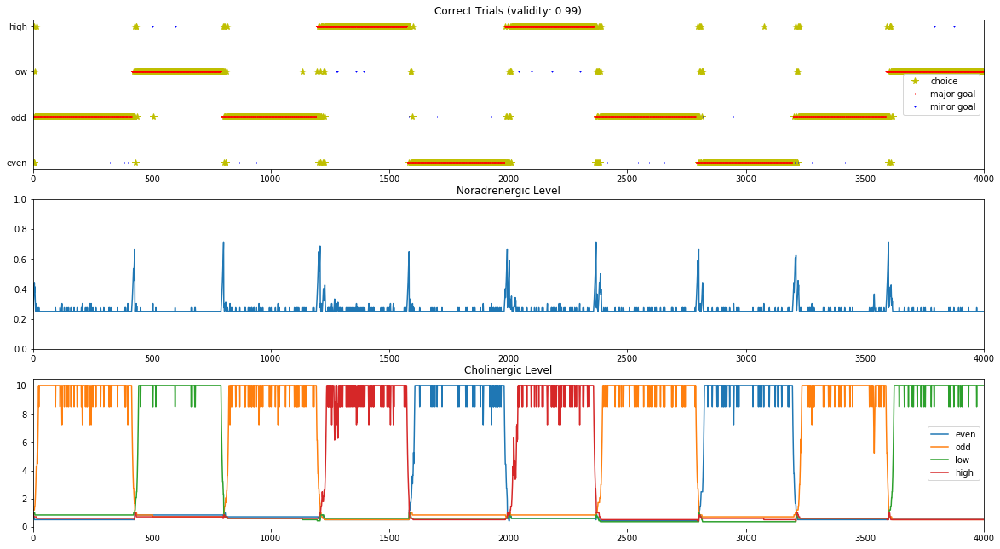

In [54]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_5a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
636/3999 = 15.9% trials occurred when the predicted digit did not match the cued digit.
    380/3999 trials occurred when the predicted digit did not match the guess-target digit.
    273/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3362/3999 = 84.1% trials occurred when the predicted digit matches the major cued digit and is valid
1/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
45/3999 = 1.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

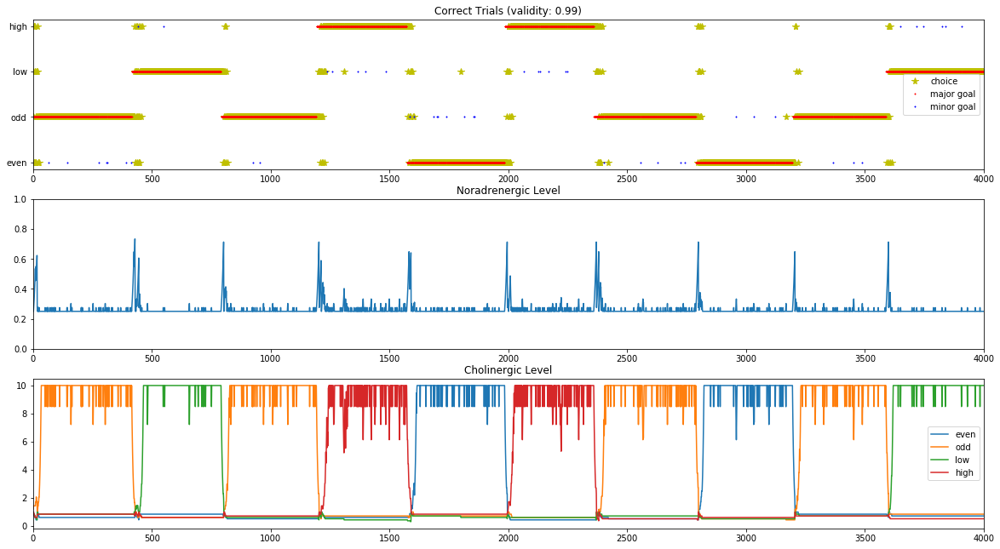

In [55]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_6a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
512/3999 = 12.8% trials occurred when the predicted digit did not match the cued digit.
    316/3999 trials occurred when the predicted digit did not match the guess-target digit.
    222/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3487/3999 = 87.2% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
40/3999 = 1.0% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

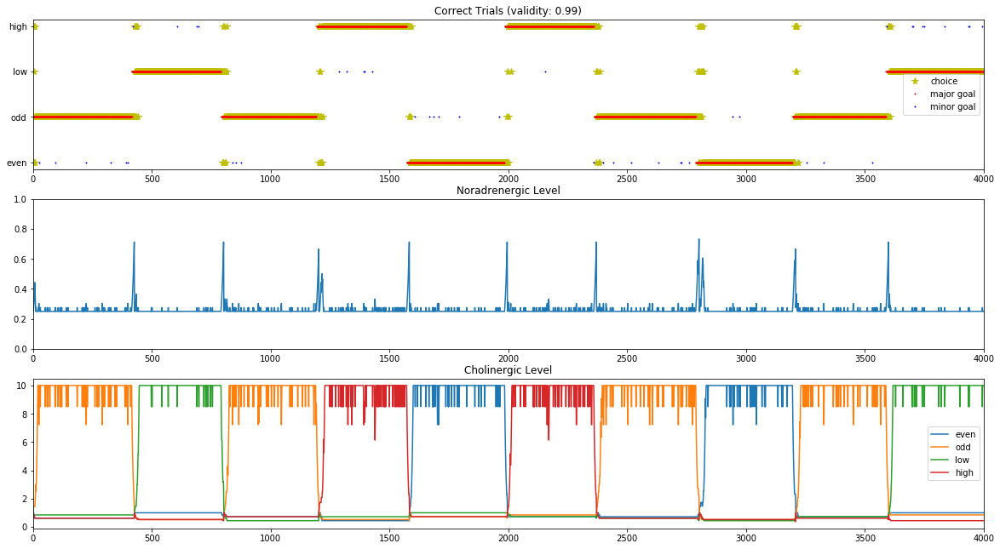

In [56]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_7a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
556/3999 = 13.9% trials occurred when the predicted digit did not match the cued digit.
    348/3999 trials occurred when the predicted digit did not match the guess-target digit.
    226/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3442/3999 = 86.1% trials occurred when the predicted digit matches the major cued digit and is valid
1/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
27/3999 = 0.7% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

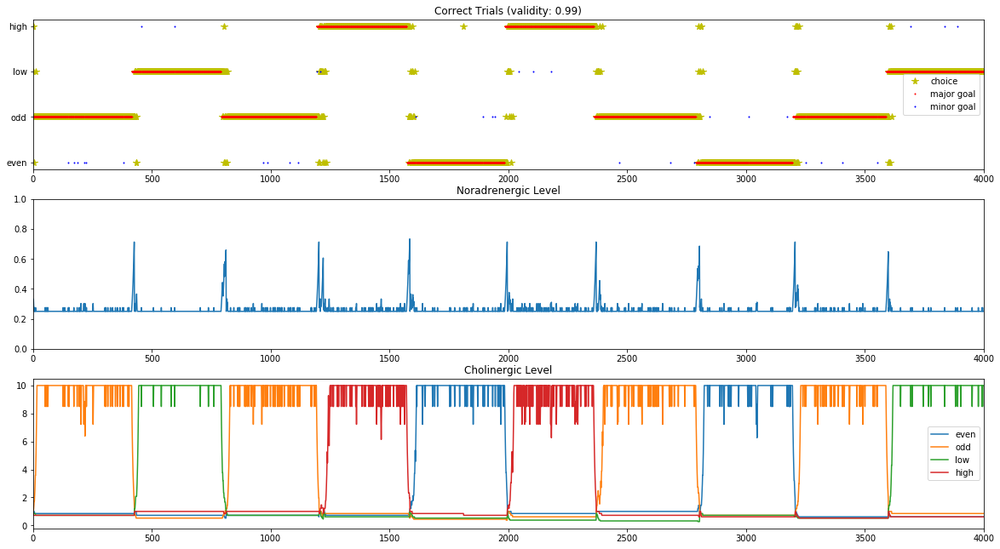

In [57]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_8a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
637/3999 = 15.9% trials occurred when the predicted digit did not match the cued digit.
    356/3999 trials occurred when the predicted digit did not match the guess-target digit.
    302/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3362/3999 = 84.1% trials occurred when the predicted digit matches the major cued digit and is valid
0/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
41/3999 = 1.0% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

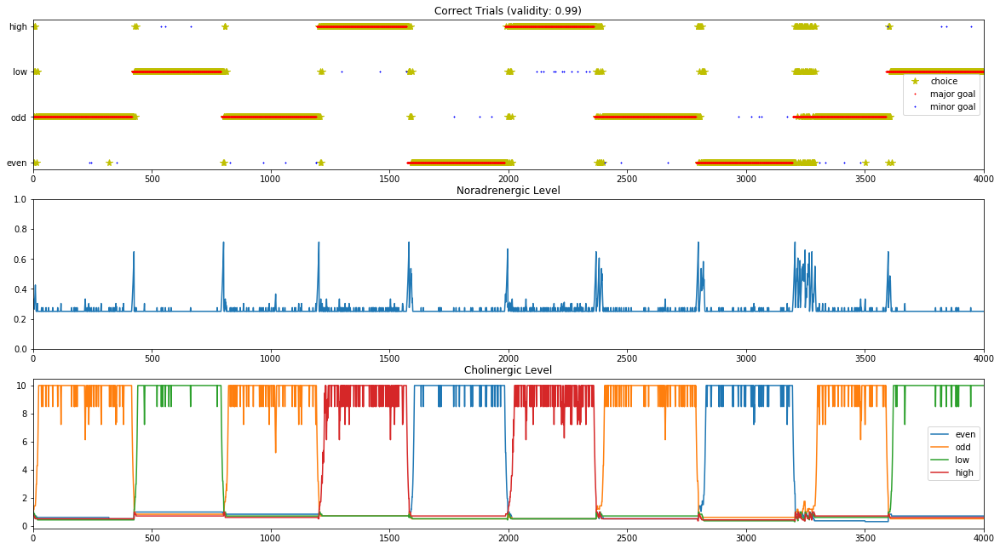

In [58]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_9a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.99 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
629/3999 = 15.7% trials occurred when the predicted digit did not match the cued digit.
    368/3999 trials occurred when the predicted digit did not match the guess-target digit.
    294/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
3369/3999 = 84.2% trials occurred when the predicted digit matches the major cued digit and is valid
1/3999 = 0.0% trials occurred when the predicted digit matches the minor cued digit and is valid
38/3999 = 1.0% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag lengt

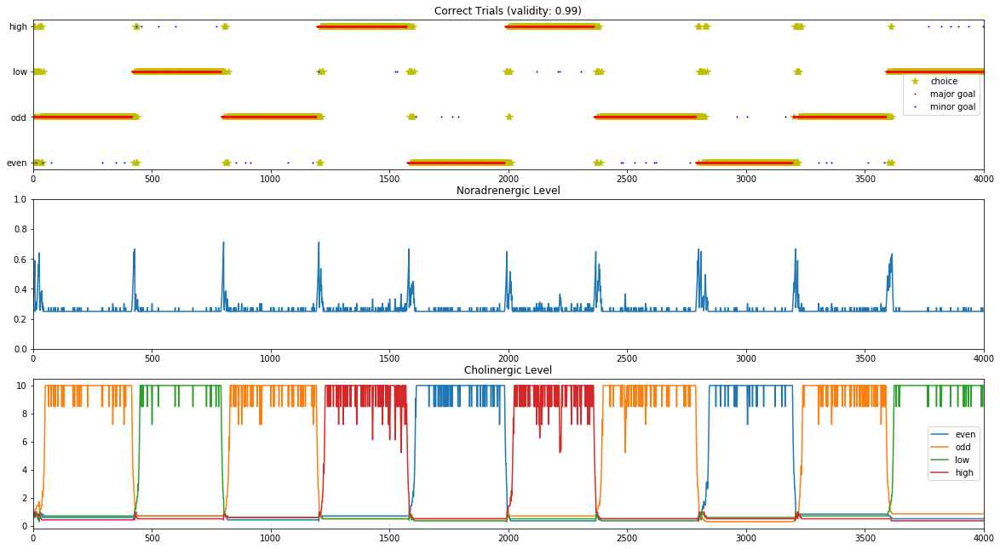

In [59]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_99_10a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.99,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.99)


In [60]:
all_99a_case_probs = [all_prob_99_1a,all_prob_99_2a,all_prob_99_3a,all_prob_99_4a,all_prob_99_5a,\
                      all_prob_99_6a,all_prob_99_7a,all_prob_99_8a,all_prob_99_9a,all_prob_99_10a]
averages_99a = average_probs(all_99a_case_probs)


Average lag length is: 33
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.14548637159289823, 0.8543385846461616, 0.00017504376094023508, 0.0, 0.06424106026506626, 0.08689672418104526, 0.009402350587646912]


### 4.2.2: validity_choices=0.85

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1118/3999 = 28.0% trials occurred when the predicted digit did not match the cued digit.
    360/3999 trials occurred when the predicted digit did not match the guess-target digit.
    830/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2875/3999 = 71.9% trials occurred when the predicted digit matches the major cued digit and is valid
6/3999 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
532/3999 = 13.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

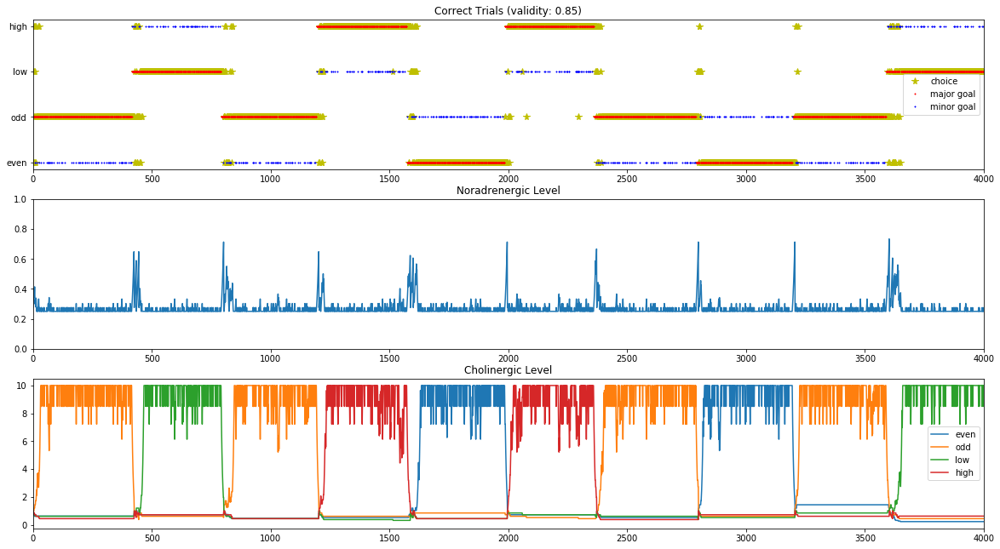

In [61]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_1a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1057/3999 = 26.4% trials occurred when the predicted digit did not match the cued digit.
    331/3999 trials occurred when the predicted digit did not match the guess-target digit.
    790/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2923/3999 = 73.1% trials occurred when the predicted digit matches the major cued digit and is valid
19/3999 = 0.5% trials occurred when the predicted digit matches the minor cued digit and is valid
491/3999 = 12.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

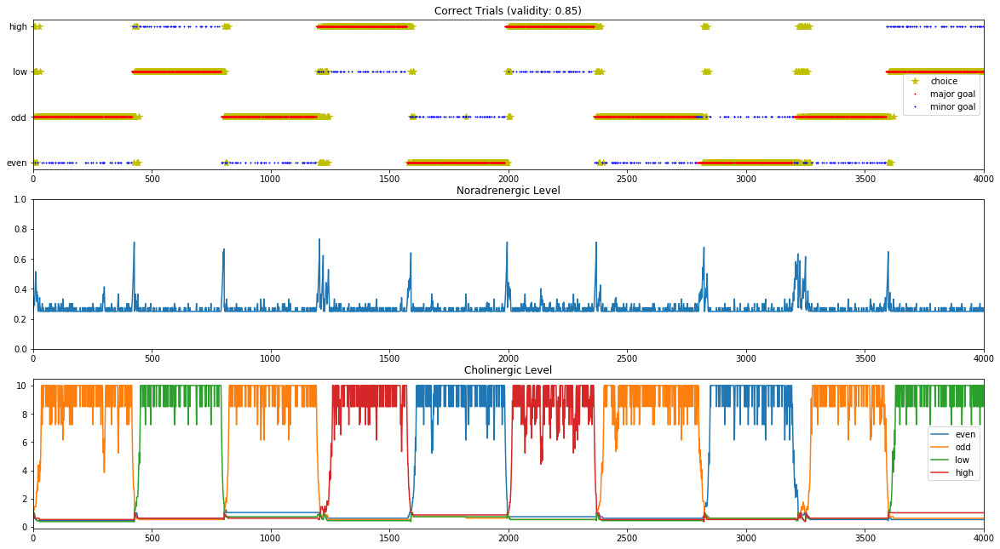

In [62]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_2a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1087/3999 = 27.2% trials occurred when the predicted digit did not match the cued digit.
    381/3999 trials occurred when the predicted digit did not match the guess-target digit.
    791/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2895/3999 = 72.4% trials occurred when the predicted digit matches the major cued digit and is valid
17/3999 = 0.4% trials occurred when the predicted digit matches the minor cued digit and is valid
486/3999 = 12.2% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

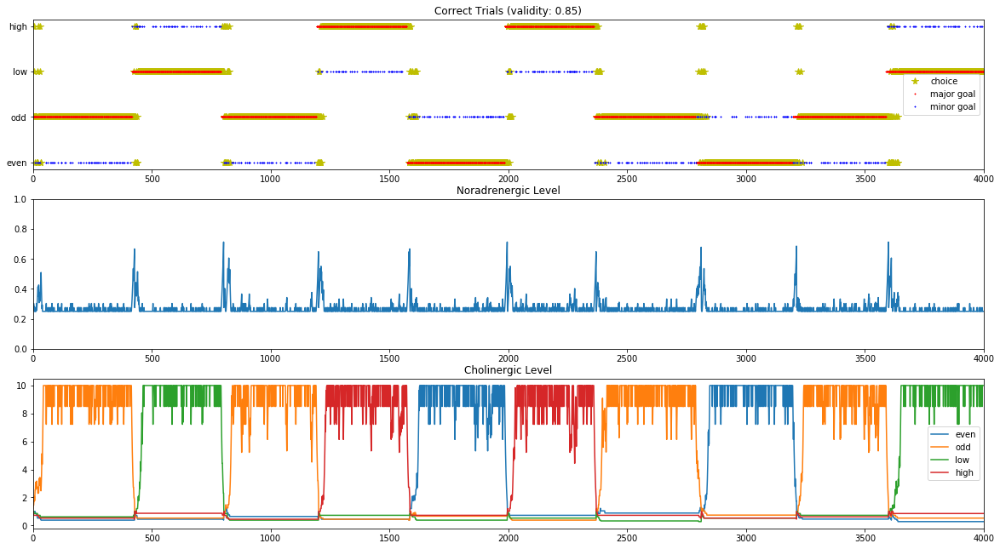

In [63]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_3a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1151/3999 = 28.8% trials occurred when the predicted digit did not match the cued digit.
    353/3999 trials occurred when the predicted digit did not match the guess-target digit.
    878/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2836/3999 = 70.9% trials occurred when the predicted digit matches the major cued digit and is valid
12/3999 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
522/3999 = 13.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

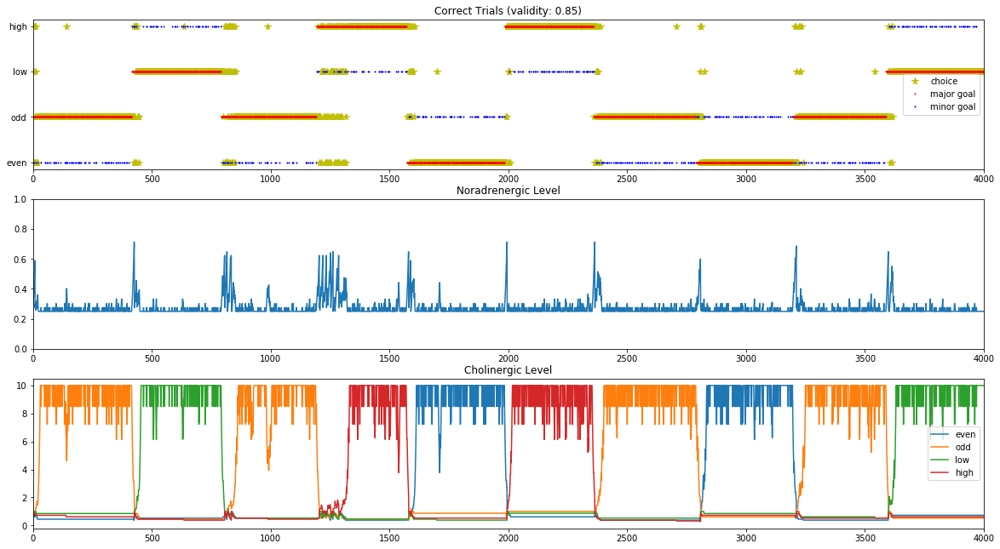

In [64]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_4a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1074/3999 = 26.9% trials occurred when the predicted digit did not match the cued digit.
    394/3999 trials occurred when the predicted digit did not match the guess-target digit.
    768/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2915/3999 = 72.9% trials occurred when the predicted digit matches the major cued digit and is valid
10/3999 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
485/3999 = 12.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

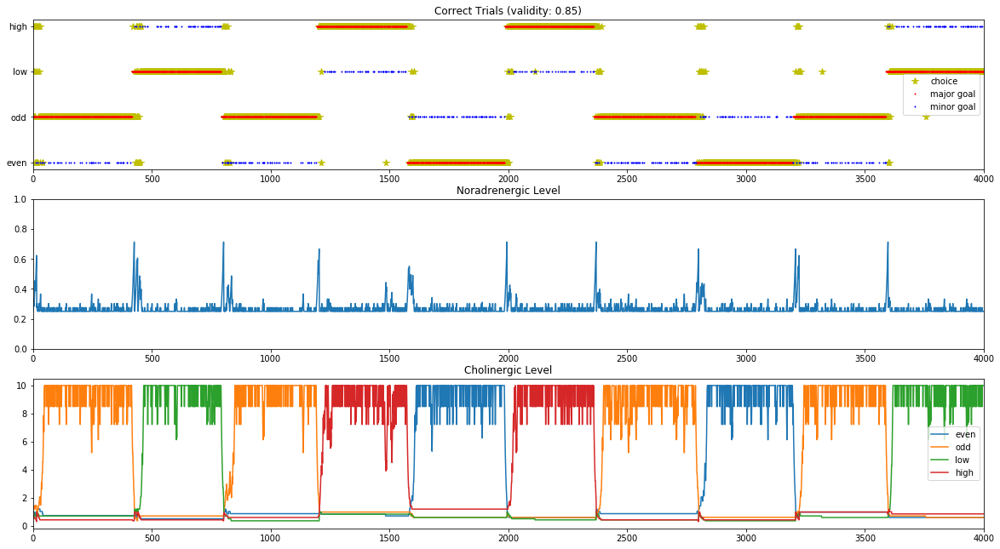

In [65]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_5a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1052/3999 = 26.3% trials occurred when the predicted digit did not match the cued digit.
    329/3999 trials occurred when the predicted digit did not match the guess-target digit.
    783/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2937/3999 = 73.4% trials occurred when the predicted digit matches the major cued digit and is valid
10/3999 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
485/3999 = 12.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

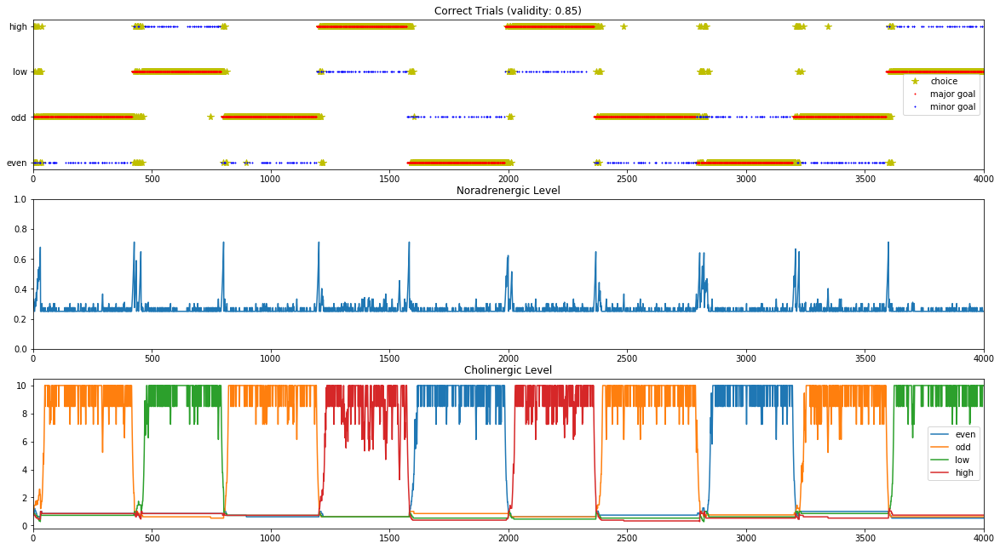

In [66]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_6a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1076/3999 = 26.9% trials occurred when the predicted digit did not match the cued digit.
    339/3999 trials occurred when the predicted digit did not match the guess-target digit.
    796/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2914/3999 = 72.9% trials occurred when the predicted digit matches the major cued digit and is valid
9/3999 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
526/3999 = 13.2% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

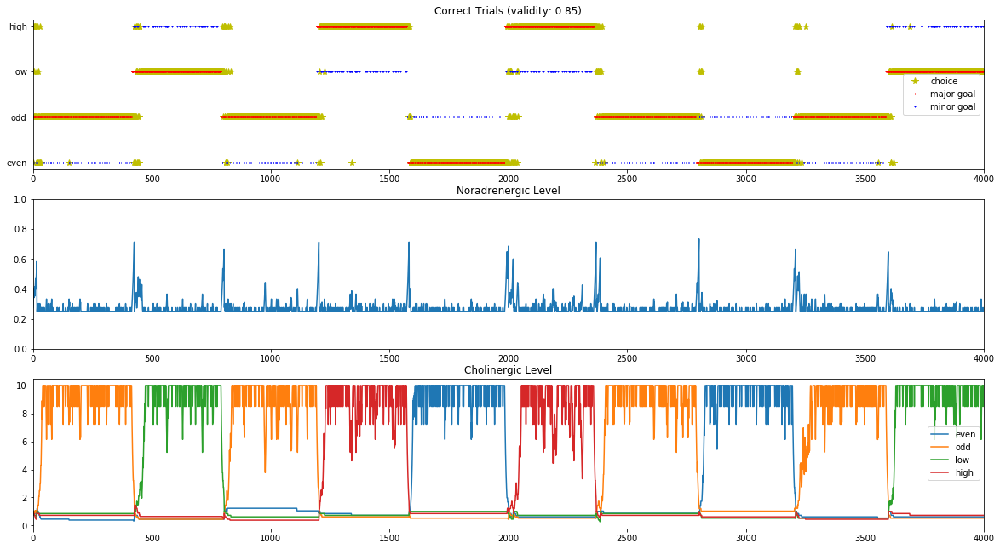

In [67]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_7a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1084/3999 = 27.1% trials occurred when the predicted digit did not match the cued digit.
    349/3999 trials occurred when the predicted digit did not match the guess-target digit.
    815/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2907/3999 = 72.7% trials occurred when the predicted digit matches the major cued digit and is valid
8/3999 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
519/3999 = 13.0% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

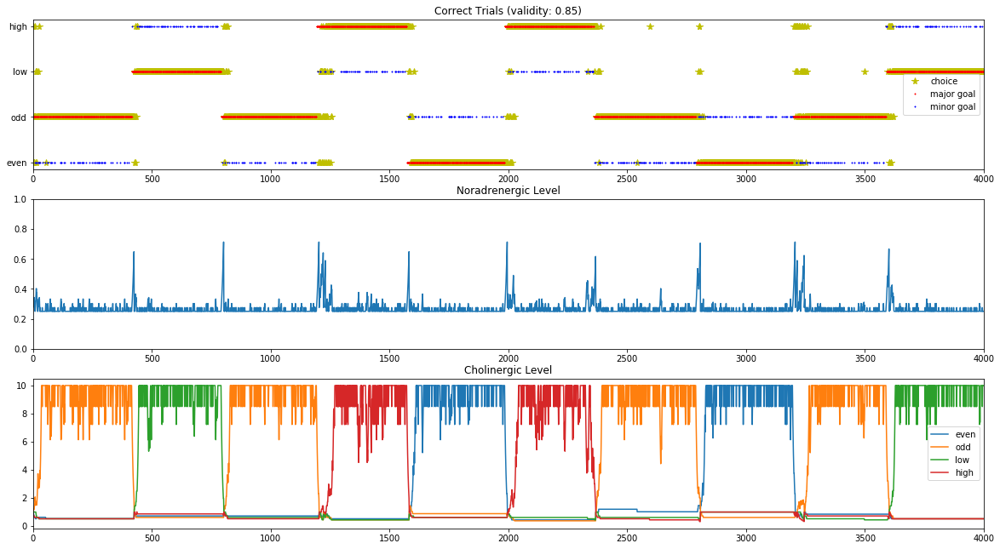

In [68]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_8a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1154/3999 = 28.9% trials occurred when the predicted digit did not match the cued digit.
    347/3999 trials occurred when the predicted digit did not match the guess-target digit.
    886/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2827/3999 = 70.7% trials occurred when the predicted digit matches the major cued digit and is valid
18/3999 = 0.5% trials occurred when the predicted digit matches the minor cued digit and is valid
519/3999 = 13.0% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

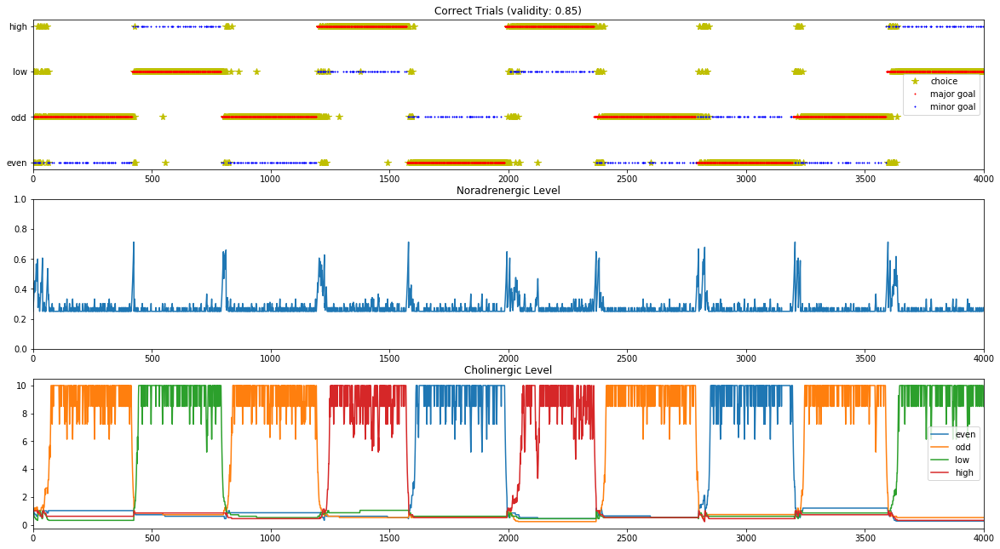

In [69]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_9a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.85 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1133/3999 = 28.3% trials occurred when the predicted digit did not match the cued digit.
    375/3999 trials occurred when the predicted digit did not match the guess-target digit.
    828/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2859/3999 = 71.5% trials occurred when the predicted digit matches the major cued digit and is valid
7/3999 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
490/3999 = 12.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag le

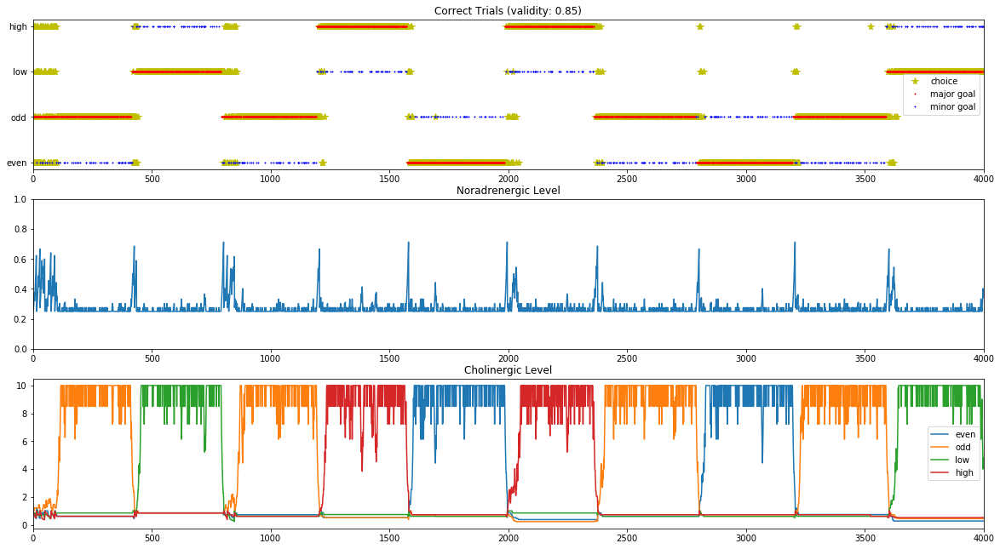

In [70]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_85_10a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.85,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.85)


In [71]:
all_85a_case_probs = [all_prob_85_1a,all_prob_85_2a,all_prob_85_3a,all_prob_85_4a,all_prob_85_5a,\
                      all_prob_85_6a,all_prob_85_7a,all_prob_85_8a,all_prob_85_9a,all_prob_85_10a]
averages_85a = average_probs(all_85a_case_probs)


Average lag length is: 40
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.27471867966991753, 0.7223805951487872, 0.002900725181295324, 0.0, 0.20417604401100276, 0.0889722430607652, 0.1264066016504126]


### 4.2.3: validity_choices=0.7

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1722/3999 = 43.1% trials occurred when the predicted digit did not match the cued digit.
    392/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1493/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2236/3999 = 55.9% trials occurred when the predicted digit matches the major cued digit and is valid
41/3999 = 1.0% trials occurred when the predicted digit matches the minor cued digit and is valid
985/3999 = 24.6% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

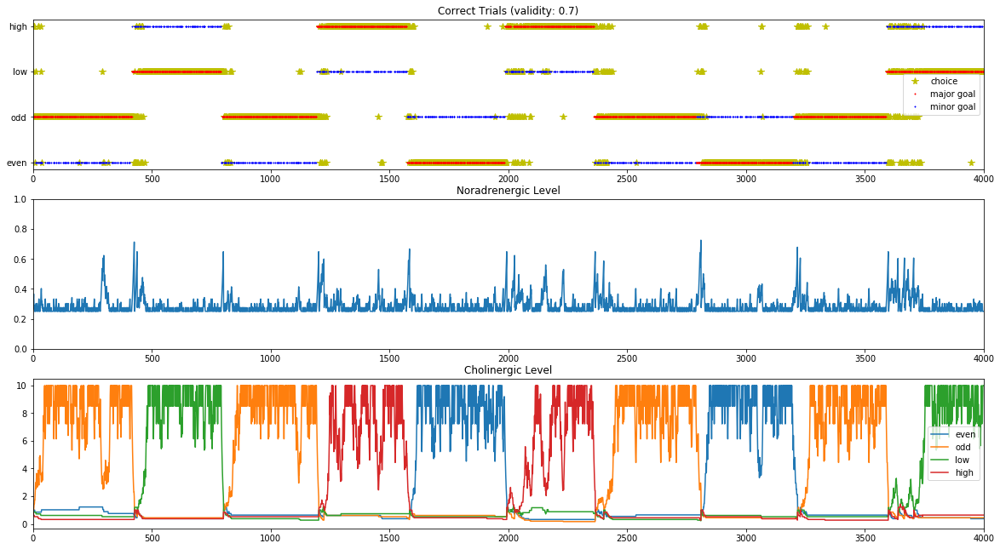

In [72]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_1a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1712/3999 = 42.8% trials occurred when the predicted digit did not match the cued digit.
    335/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1508/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2222/3999 = 55.6% trials occurred when the predicted digit matches the major cued digit and is valid
65/3999 = 1.6% trials occurred when the predicted digit matches the minor cued digit and is valid
924/3999 = 23.1% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

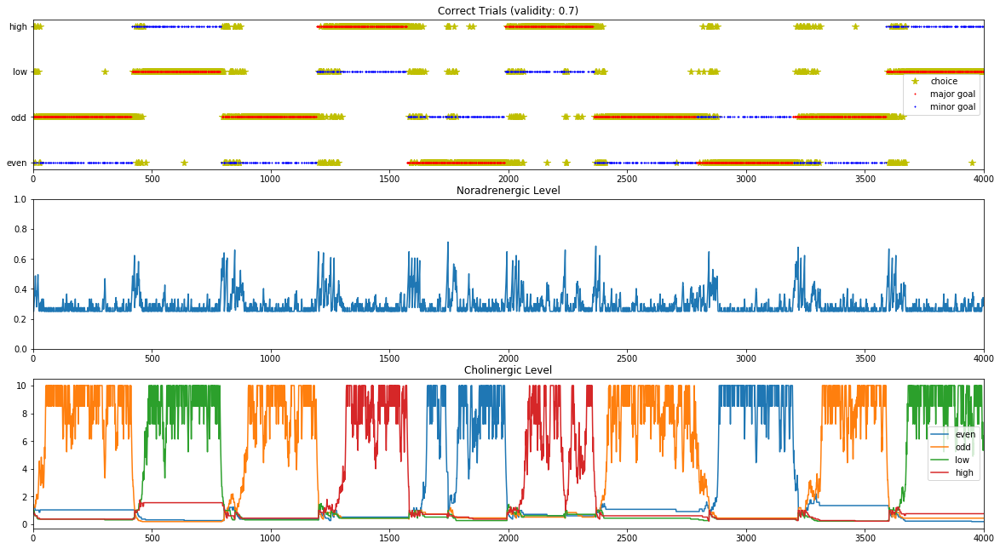

In [73]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_2a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1773/3999 = 44.3% trials occurred when the predicted digit did not match the cued digit.
    341/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1562/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2160/3999 = 54.0% trials occurred when the predicted digit matches the major cued digit and is valid
66/3999 = 1.7% trials occurred when the predicted digit matches the minor cued digit and is valid
942/3999 = 23.6% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

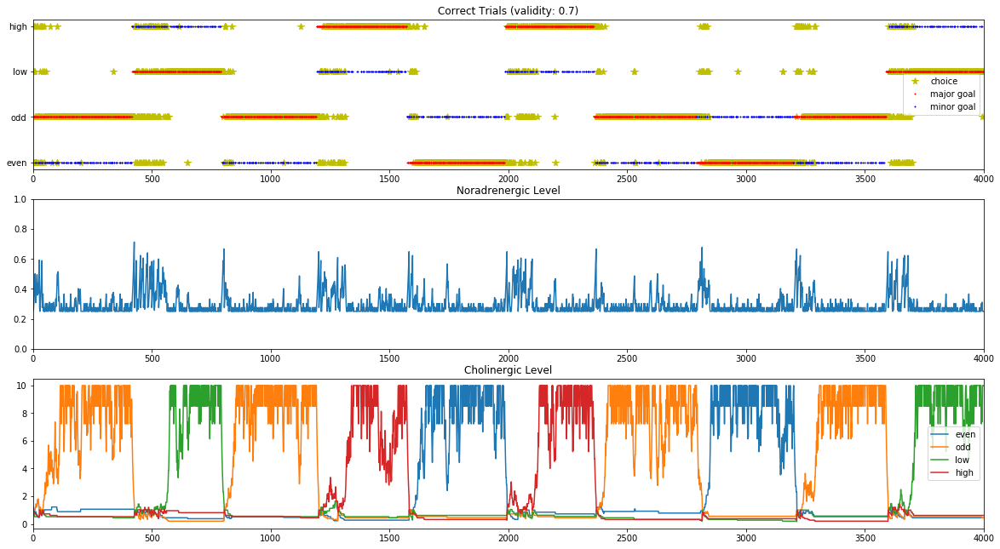

In [74]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_3a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1819/3999 = 45.5% trials occurred when the predicted digit did not match the cued digit.
    342/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1608/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2095/3999 = 52.4% trials occurred when the predicted digit matches the major cued digit and is valid
85/3999 = 2.1% trials occurred when the predicted digit matches the minor cued digit and is valid
892/3999 = 22.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

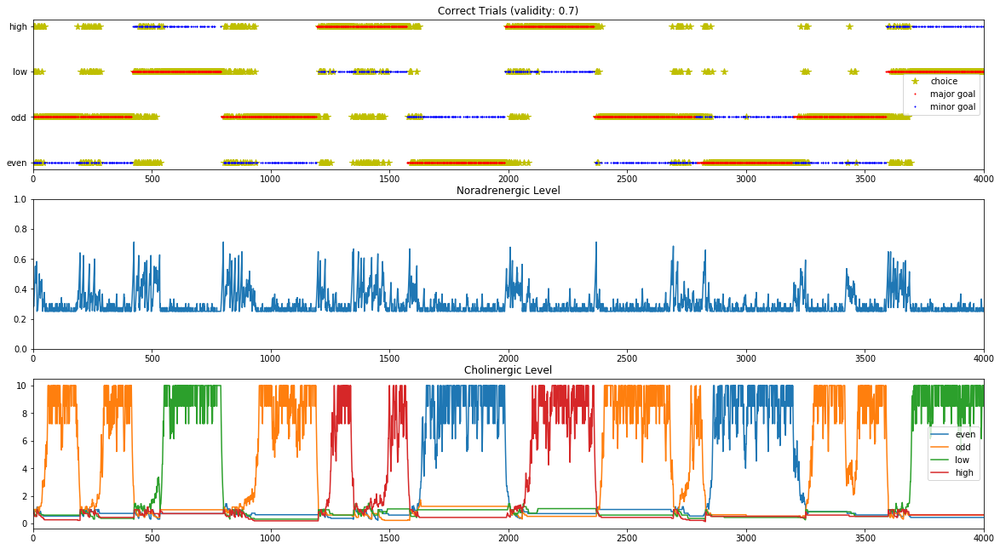

In [75]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_4a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1686/3999 = 42.2% trials occurred when the predicted digit did not match the cued digit.
    324/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1521/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2228/3999 = 55.7% trials occurred when the predicted digit matches the major cued digit and is valid
85/3999 = 2.1% trials occurred when the predicted digit matches the minor cued digit and is valid
929/3999 = 23.2% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

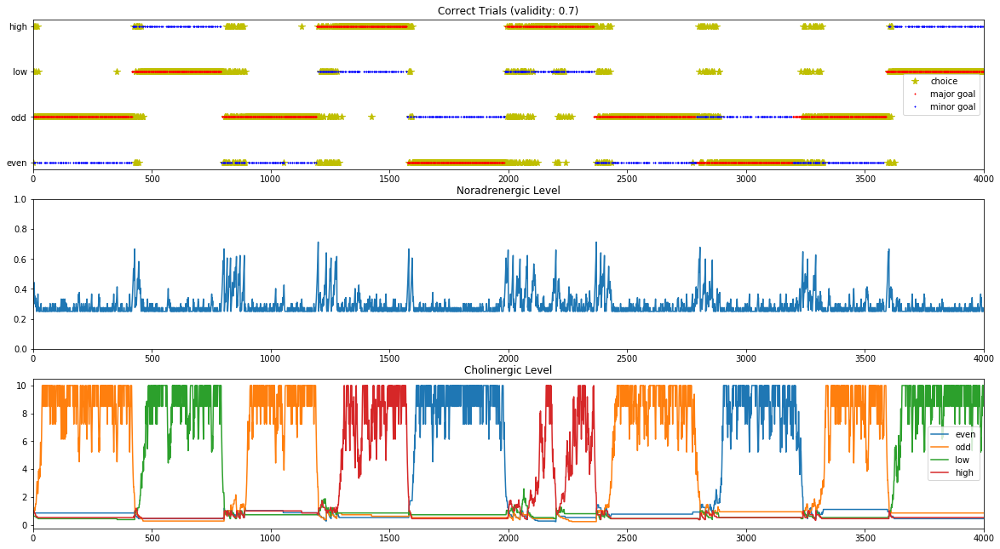

In [76]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_5a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1638/3999 = 41.0% trials occurred when the predicted digit did not match the cued digit.
    358/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1419/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2308/3999 = 57.7% trials occurred when the predicted digit matches the major cued digit and is valid
53/3999 = 1.3% trials occurred when the predicted digit matches the minor cued digit and is valid
914/3999 = 22.9% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

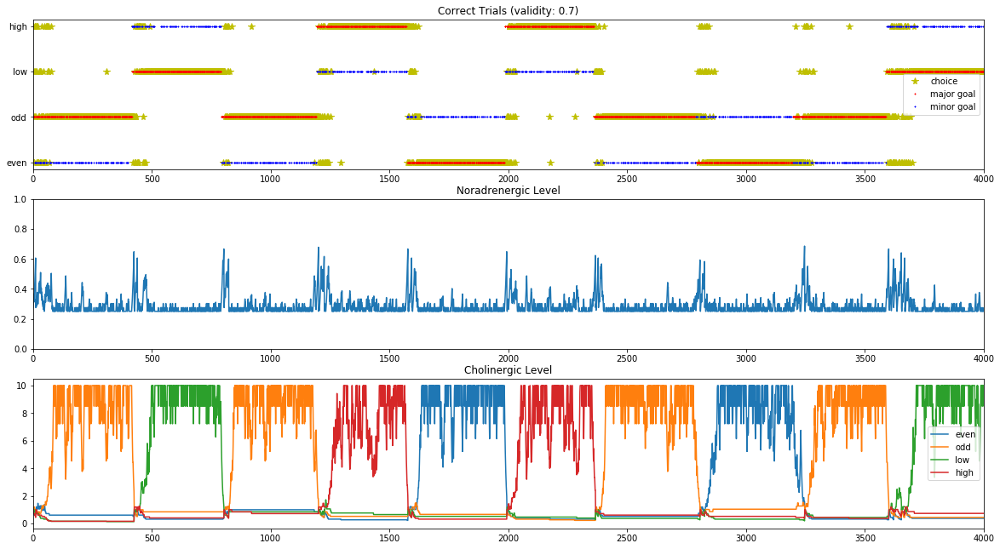

In [77]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_6a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1718/3999 = 43.0% trials occurred when the predicted digit did not match the cued digit.
    349/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1494/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2245/3999 = 56.1% trials occurred when the predicted digit matches the major cued digit and is valid
36/3999 = 0.9% trials occurred when the predicted digit matches the minor cued digit and is valid
960/3999 = 24.0% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

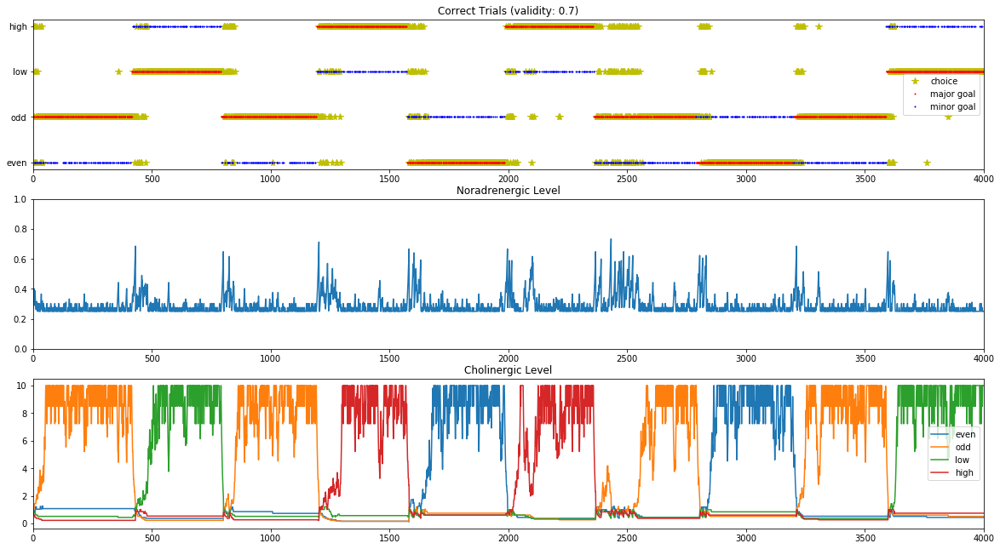

In [78]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_7a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1915/3999 = 47.9% trials occurred when the predicted digit did not match the cued digit.
    355/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1708/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2008/3999 = 50.2% trials occurred when the predicted digit matches the major cued digit and is valid
76/3999 = 1.9% trials occurred when the predicted digit matches the minor cued digit and is valid
933/3999 = 23.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

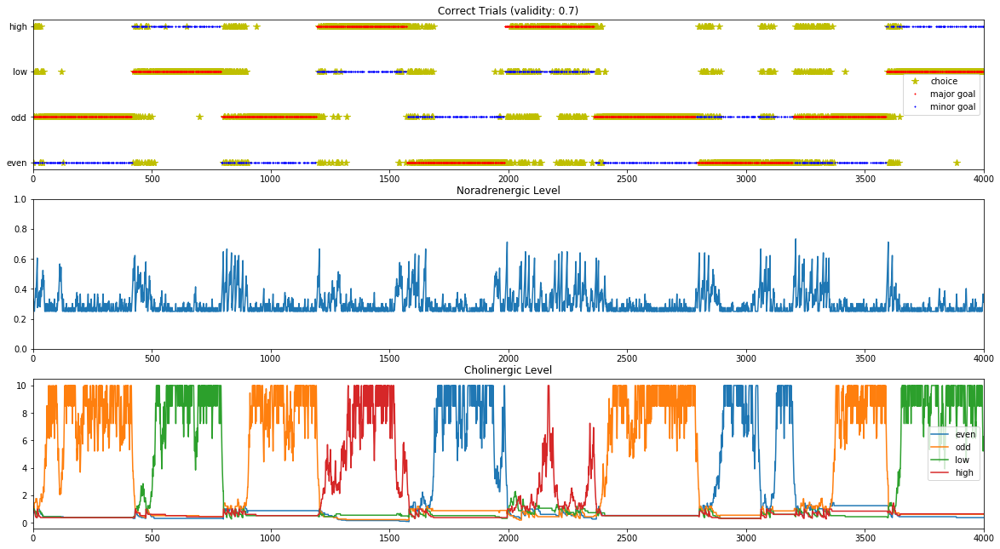

In [79]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_8a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1809/3999 = 45.2% trials occurred when the predicted digit did not match the cued digit.
    335/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1624/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2125/3999 = 53.1% trials occurred when the predicted digit matches the major cued digit and is valid
65/3999 = 1.6% trials occurred when the predicted digit matches the minor cued digit and is valid
916/3999 = 22.9% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

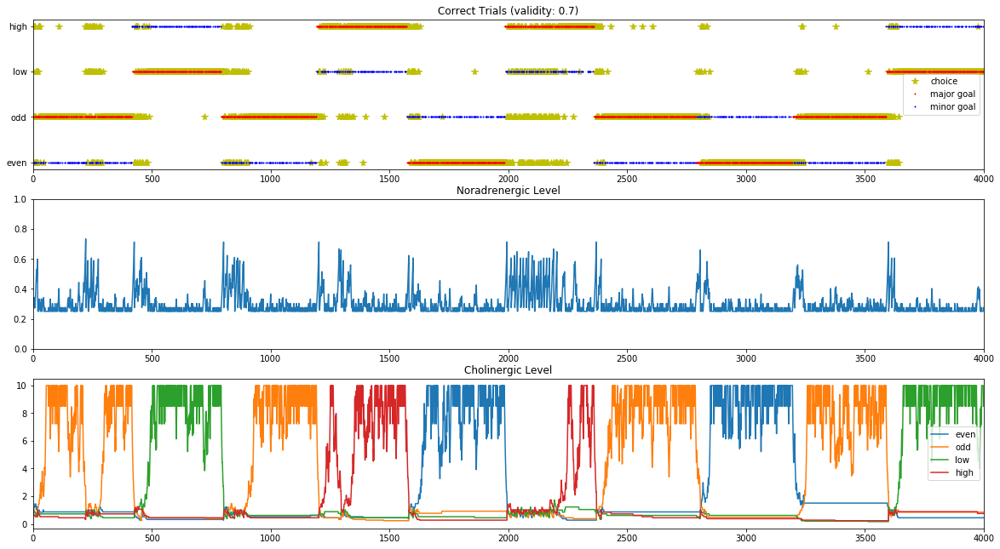

In [80]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_9a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among 0.7 in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1635/3999 = 40.9% trials occurred when the predicted digit did not match the cued digit.
    340/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1416/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2324/3999 = 58.1% trials occurred when the predicted digit matches the major cued digit and is valid
40/3999 = 1.0% trials occurred when the predicted digit matches the minor cued digit and is valid
973/3999 = 24.3% trials occurred when the predicted digit matches the major cued digit but is invalidly altered
Lag l

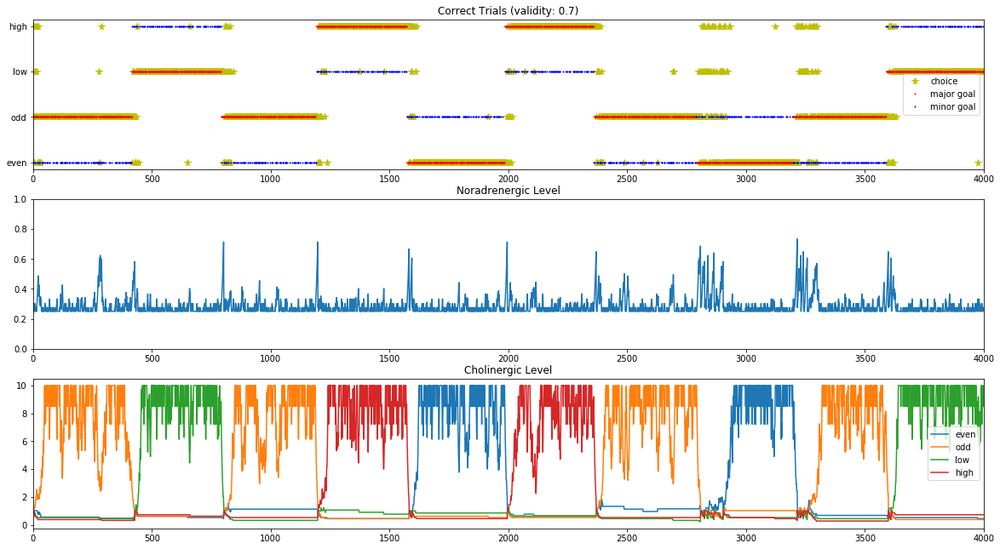

In [81]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_70_10a = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=0.70,ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold, previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=0.70)


In [82]:
all_70a_case_probs = [all_prob_70_1a,all_prob_70_2a,all_prob_70_3a,all_prob_70_4a,all_prob_70_5a,\
                      all_prob_70_6a,all_prob_70_7a,all_prob_70_8a,all_prob_70_9a,all_prob_70_10a]
averages_70a = average_probs(all_70a_case_probs)


Average lag length is: 70
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.4357839459864966, 0.5489122280570142, 0.015303825956489122, 0.0, 0.3839209802450612, 0.08679669917479368, 0.23425856464116027]


### 4.2.4: validity_choices=[0.99, 0.85, 0.70]

A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1267/3999 = 31.7% trials occurred when the predicted digit did not match the cued digit.
    375/3999 trials occurred when the predicted digit did not match the guess-target digit.
    970/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2708/3999 = 67.7% trials occurred when the predicted digit matches the major cued digit and is valid
24/3999 = 0.6% trials occurred when the predicted digit matches the minor cued digit and is valid
577/3999 = 14.4% trials occurred when the predicted digit matches the major cued digit but is invalidly 

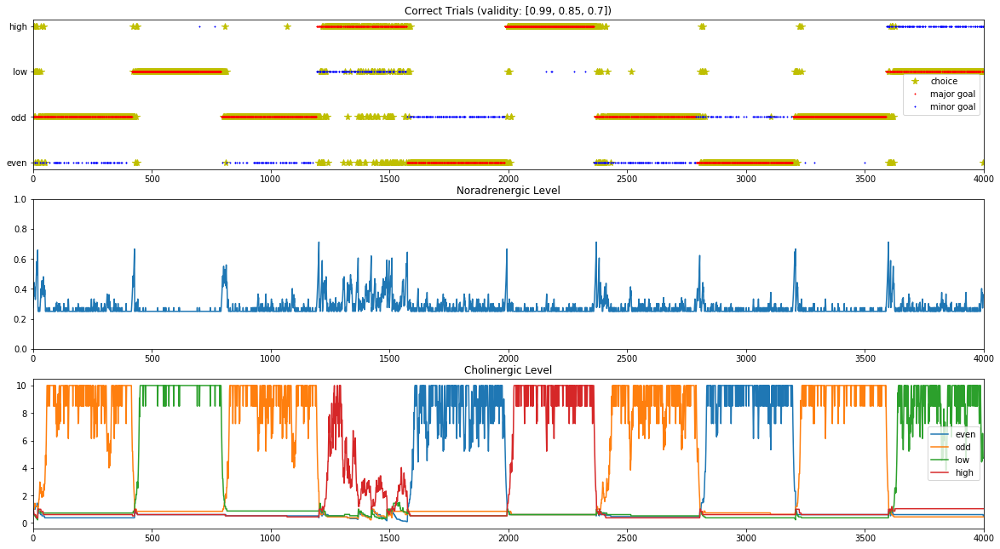

In [83]:
# trialRange+/-30 and two possibly valid cues (1) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_1 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1211/3999 = 30.3% trials occurred when the predicted digit did not match the cued digit.
    363/3999 trials occurred when the predicted digit did not match the guess-target digit.
    941/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2758/3999 = 69.0% trials occurred when the predicted digit matches the major cued digit and is valid
30/3999 = 0.8% trials occurred when the predicted digit matches the minor cued digit and is valid
531/3999 = 13.3% trials occurred when the predicted digit matches the major cued digit but is invalidly 

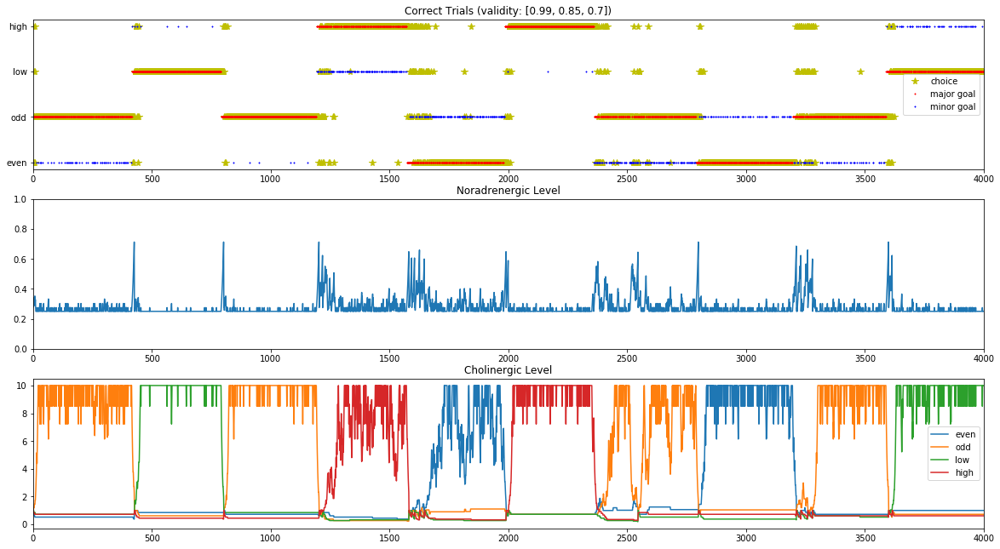

In [84]:
# trialRange+/-30 and two possibly valid cues (2) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_2 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1003/3999 = 25.1% trials occurred when the predicted digit did not match the cued digit.
    341/3999 trials occurred when the predicted digit did not match the guess-target digit.
    725/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2987/3999 = 74.7% trials occurred when the predicted digit matches the major cued digit and is valid
9/3999 = 0.2% trials occurred when the predicted digit matches the minor cued digit and is valid
459/3999 = 11.5% trials occurred when the predicted digit matches the major cued digit but is invalidly a

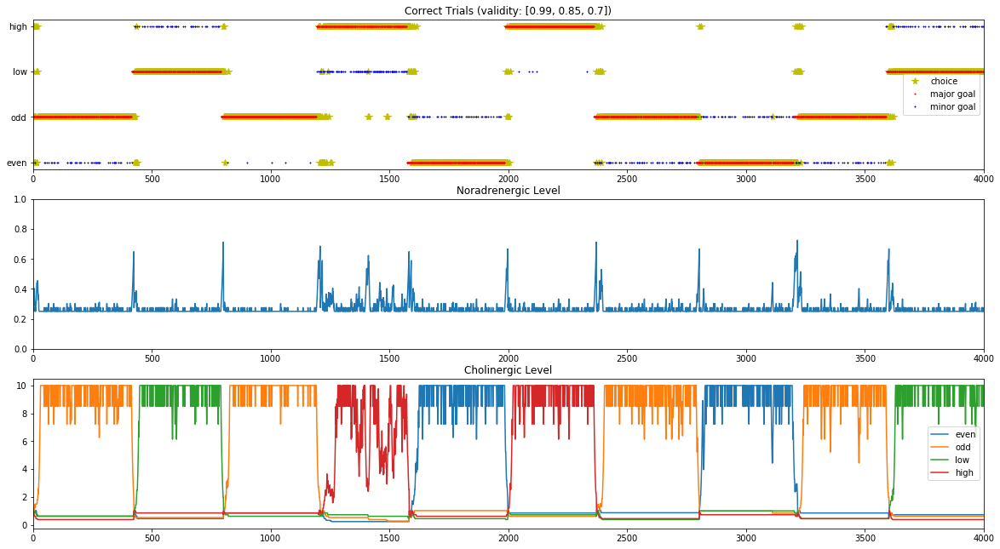

In [85]:
# trialRange+/-30 and two possibly valid cues (3) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_3 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1280/3999 = 32.0% trials occurred when the predicted digit did not match the cued digit.
    328/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1046/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2677/3999 = 66.9% trials occurred when the predicted digit matches the major cued digit and is valid
42/3999 = 1.1% trials occurred when the predicted digit matches the minor cued digit and is valid
660/3999 = 16.5% trials occurred when the predicted digit matches the major cued digit but is invalidly

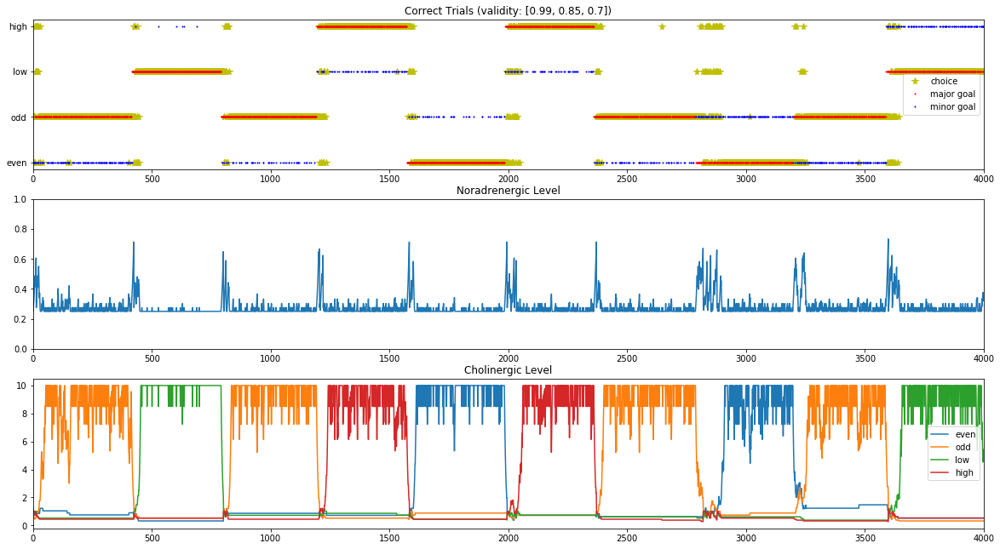

In [86]:
# trialRange+/-30 and two possibly valid cues (4) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_4 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1031/3999 = 25.8% trials occurred when the predicted digit did not match the cued digit.
    385/3999 trials occurred when the predicted digit did not match the guess-target digit.
    711/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2957/3999 = 73.9% trials occurred when the predicted digit matches the major cued digit and is valid
11/3999 = 0.3% trials occurred when the predicted digit matches the minor cued digit and is valid
457/3999 = 11.4% trials occurred when the predicted digit matches the major cued digit but is invalidly 

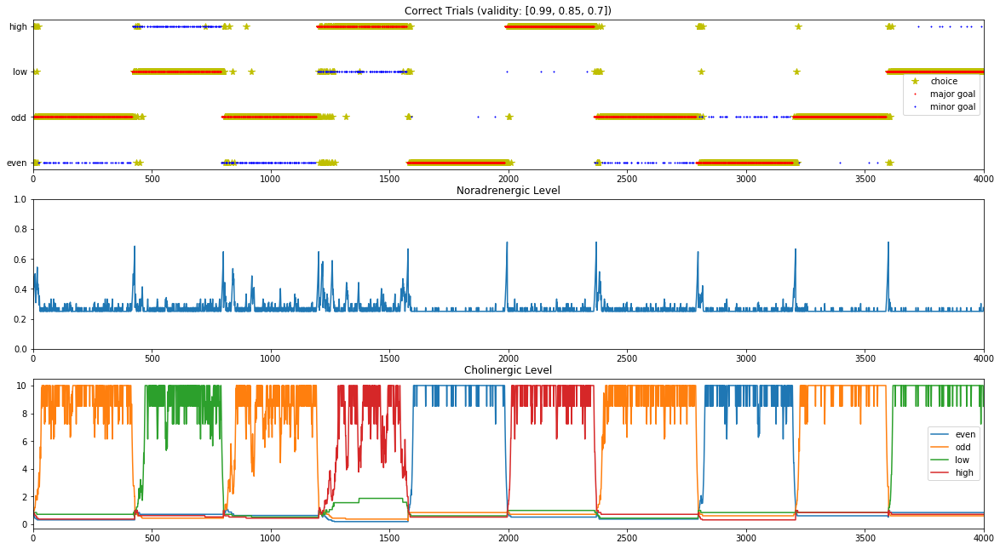

In [87]:
# trialRange+/-30 and two possibly valid cues (5) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_5 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1414/3999 = 35.4% trials occurred when the predicted digit did not match the cued digit.
    362/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1157/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2534/3999 = 63.4% trials occurred when the predicted digit matches the major cued digit and is valid
51/3999 = 1.3% trials occurred when the predicted digit matches the minor cued digit and is valid
603/3999 = 15.1% trials occurred when the predicted digit matches the major cued digit but is invalidly

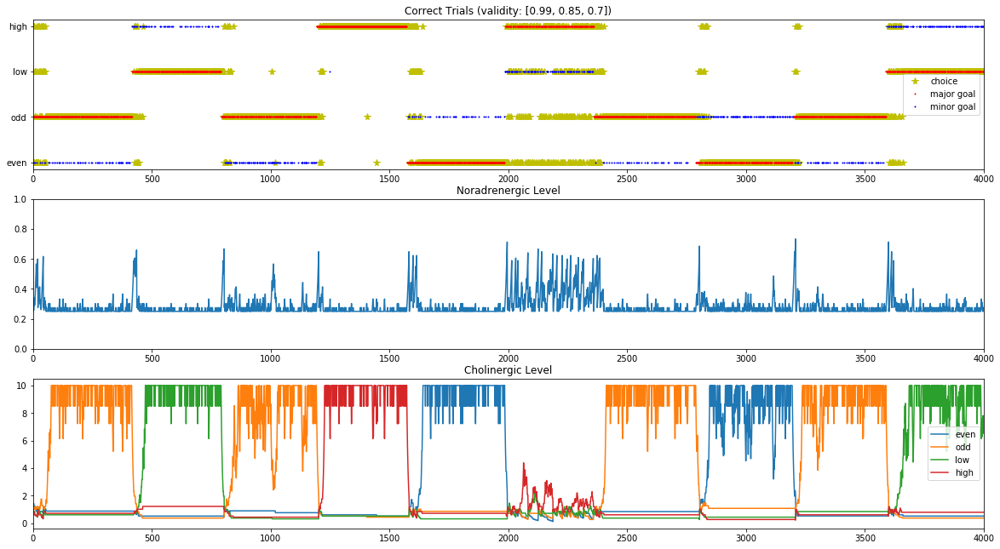

In [88]:
# trialRange+/-30 and two possibly valid cues (6) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_6 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1349/3999 = 33.7% trials occurred when the predicted digit did not match the cued digit.
    317/3999 trials occurred when the predicted digit did not match the guess-target digit.
    1130/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2629/3999 = 65.7% trials occurred when the predicted digit matches the major cued digit and is valid
21/3999 = 0.5% trials occurred when the predicted digit matches the minor cued digit and is valid
638/3999 = 16.0% trials occurred when the predicted digit matches the major cued digit but is invalidly

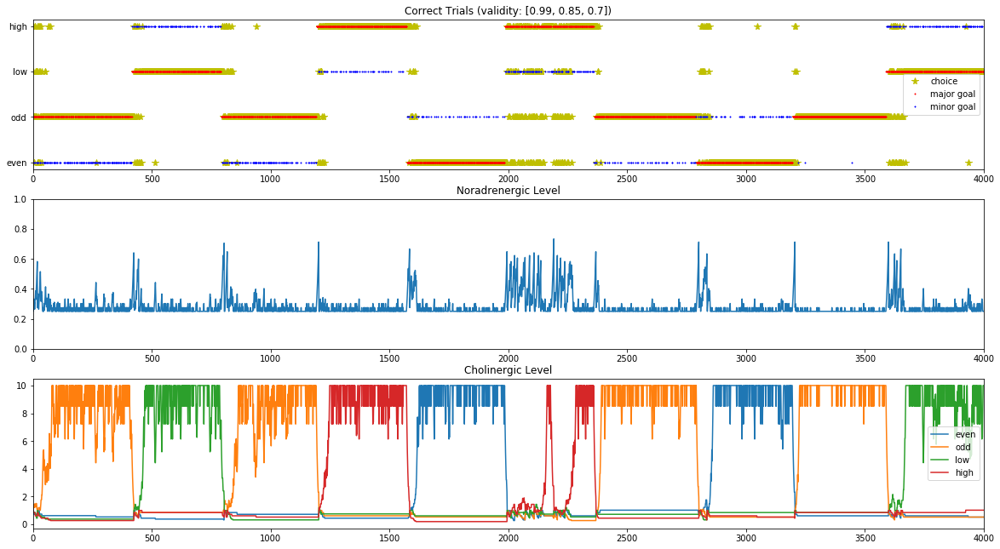

In [89]:
# trialRange+/-30 and two possibly valid cues (7) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_7 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1093/3999 = 27.3% trials occurred when the predicted digit did not match the cued digit.
    337/3999 trials occurred when the predicted digit did not match the guess-target digit.
    826/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2884/3999 = 72.1% trials occurred when the predicted digit matches the major cued digit and is valid
22/3999 = 0.6% trials occurred when the predicted digit matches the minor cued digit and is valid
498/3999 = 12.5% trials occurred when the predicted digit matches the major cued digit but is invalidly 

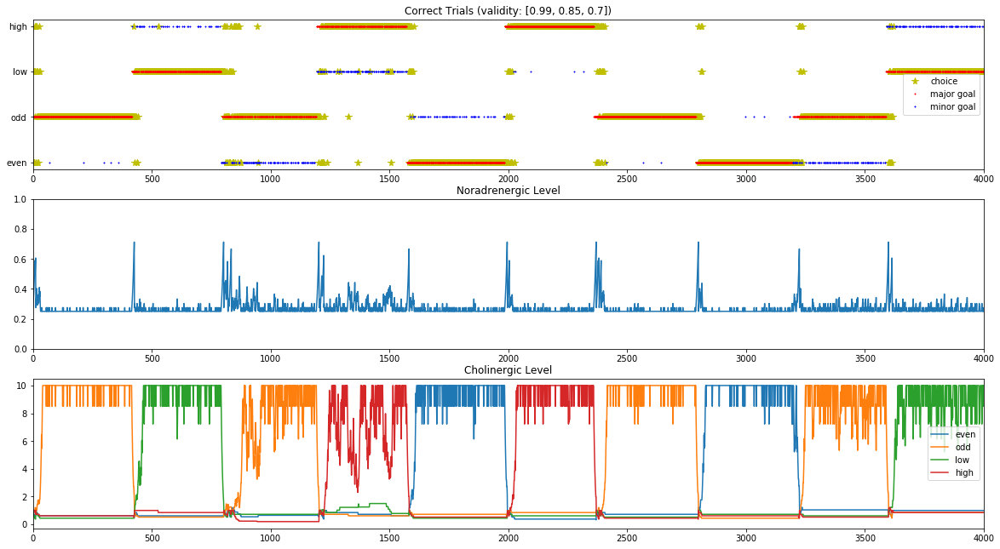

In [90]:
# trialRange+/-30 and two possibly valid cues (8) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_8 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1110/3999 = 27.8% trials occurred when the predicted digit did not match the cued digit.
    354/3999 trials occurred when the predicted digit did not match the guess-target digit.
    830/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2873/3999 = 71.8% trials occurred when the predicted digit matches the major cued digit and is valid
16/3999 = 0.4% trials occurred when the predicted digit matches the minor cued digit and is valid
495/3999 = 12.4% trials occurred when the predicted digit matches the major cued digit but is invalidly 

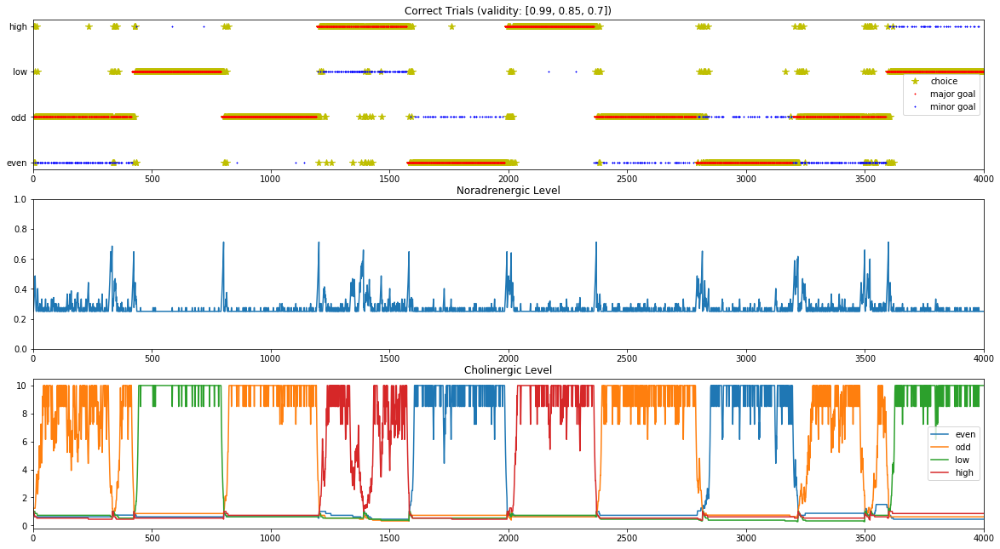

In [91]:
# trialRange+/-30 and two possibly valid cues (9) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_9 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


A cue was randomly picked among integers 0~3 (i.e. even, odd, low, high respectively) every 400+/-30 trials for 10 times.
The cue validity was randomly selected among [0.99, 0.85, 0.7] in each trial.
A major cue or its alternative is possible for each trial depends on the cue validity.
0/3999 = 0.0% trials occurred when the predicted digit matched the cued digit but the cue was invalid
1146/3999 = 28.7% trials occurred when the predicted digit did not match the cued digit.
    353/3999 trials occurred when the predicted digit did not match the guess-target digit.
    869/3999 trials occurred when the guess-target digit did not match the cued digit, i.e. when the guessed action was wrong.
2835/3999 = 70.9% trials occurred when the predicted digit matches the major cued digit and is valid
18/3999 = 0.5% trials occurred when the predicted digit matches the minor cued digit and is valid
478/3999 = 12.0% trials occurred when the predicted digit matches the major cued digit but is invalidly 

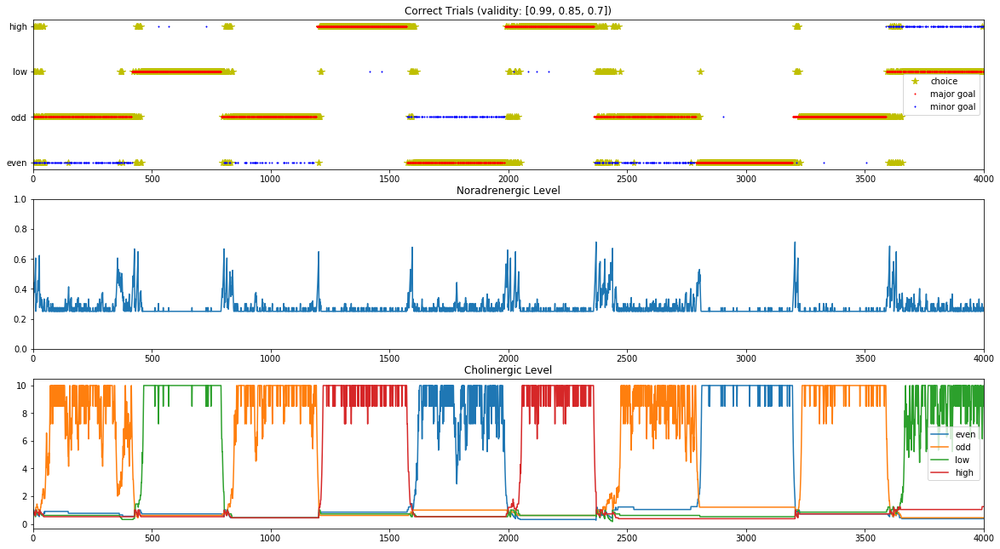

In [92]:
# trialRange+/-30 and two possibly valid cues (10) 
model_copy = copy.deepcopy(model)
correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, all_prob_multia_10 = MNIST_uncertainty_task(model_copy,dataloader,validity_choices=[0.99,0.85,0.70],ACH_CORRECT=ACH_CORRECT,ACH_INCORRECT=ACH_INCORRECT,NE_INCORRECT=NE_INCORRECT,NE_CORRECT=NE_CORRECT,trialRange=trialRange,trialInterval=trialInterval,alterValid=alterValid,num_considered=num_considered,num_threshold=num_threshold,previous_intervals=all_prob_99_1[1],previous_cues=all_prob_99_1[2],hasAChLesion=hasAChLesion,hasNELesion=hasNELesion)
plot_MNIST_uncertainty(correct, choice, ach_level, ach_avg_level, ne_level, correct_lbl, acts_prob, validity_choices=[0.99,0.85,0.70])


In [93]:
all_multia_case_probs = [all_prob_multia_1,all_prob_multia_2,all_prob_multia_3,all_prob_multia_4,all_prob_multia_5,\
                         all_prob_multia_6,all_prob_multia_7,all_prob_multia_8,all_prob_multia_9,all_prob_multia_10]
averages_multia = average_probs(all_multia_case_probs)


Average lag length is: 45
Average prob pred wrong, prob pred cue A valid, prob pred cue B valid, prob pred cue A invalid,
    prob guess not match cue, prob pred not match guess, prob match cue A invalid alter: 
[0.29767441860465116, 0.6962240560140035, 0.0061015253813453355, 0.0, 0.2301825456364091, 0.0878969742435609, 0.13493373343335832]
